In [1]:
"""
jupyter-nbconvert report_plots.ipynb --to python; python -u report_plots.py

"""

'\njupyter-nbconvert report_plots.ipynb --to python; python -u report_plots.py\n\n'

In [2]:
from __future__ import division
import os
import glob
import pickle
from natsort import natsorted
import argparse
import os
import sys
import numpy as np
import tqdm
import pandas as pd

import scipy as sp
import numpy as np
from pprint import pprint
import glob
import sys
sys.path.append('../')
from plume_env import PlumeEnvironment, PlumeFrameStackEnvironment
import config
import agents
import agent_analysis
import os
import sklearn
import sklearn.decomposition as skld


import sim_analysis

import importlib
import log_analysis
importlib.reload(log_analysis)

import config
np.random.seed(config.seed_global)

In [3]:
import sys
batchmode = False
if 'ipykernel_launcher' in sys.argv[0]:
    print("Interactive mode")
else:
    batchmode = True
    print("Batch/CLI mode")
    import argparse

Interactive mode


In [4]:
# Common
import matplotlib
import matplotlib.pyplot as plt
import matplotlib as mpl
from mpl_toolkits.axes_grid1 import make_axes_locatable

import matplotlib.patches as mpatches



from IPython.display import clear_output
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

import seaborn as sns
sns.set(style="white")
# print(plt.style.available)

mpl.rcParams['figure.dpi'] = 100
dpi_save = 300
font = {'family' : 'serif',
        'weight' : 'normal',
        'size'   : 18}
matplotlib.rc('font', **font)

# Interactive vs. CLI
if not batchmode:
    %matplotlib inline
    # %config InlineBackend.figure_format = 'svg'
    %config InlineBackend.figure_format = 'retina'
if batchmode:
    matplotlib.use("Agg")
    
pca3d_figsize=(10,5)

In [5]:
# Common
# outcome_colormap = {'HOME': 'green', 
#                     'OOB':'red', 
#                     'OOT':'blue'
#                    }

# outcome_colormap = {'HOME': 'skyblue', 
#                     'OOB':'orange', 
#                     'OOT':'blue'
#                    }

# regime_colormap = {'SEARCH': 'red', 
#                    'TRACK':'green', 
#                    'RECOVER':'blue', 
#                    'WARMUP':'cyan'
#                   }

importlib.reload(config)
outcome_colormap = config.outcome_colormap
regime_colormap = config.regime_colormap



# https://seaborn.pydata.org/generated/seaborn.set_color_codes.html#seaborn.set_color_codes
sns.color_palette()
sns.set_color_codes(palette='deep')

In [6]:
if batchmode:
    parser = argparse.ArgumentParser(description='')
    parser.add_argument('--expt_dir', 
                default='/home/satsingh/plume/plumezoo/latest/fly/memory/')
    args = parser.parse_args()
    print(args)
    
    expt_dir = args.expt_dir
else:
    expt_dir = '/home/satsingh/plume/plumezoo/latest/fly/memory/'

outdir = f'{expt_dir}/report_common_subspace/'
os.makedirs(outdir, exist_ok=True)

In [7]:
models = natsorted(glob.glob(f'{expt_dir}/*VRNN*.pt'))
assert len(models) > 0

In [8]:
use_datasets = ['constantx5b5', 'switch45x5b5', 'noisy3x5b5', 
#                 'constantx5b5_0.2', 
                'constantx5b5_0.4', 
#                 'constantx5b5_0.6', 
               ]
selected_df_all = []

for model_fname in models:
    model_dir = model_fname.replace('.pt', '/')
    print("model_dir", model_dir)
    model_seed = model_dir.split('seed')[-1].split('/')[0]

#     outdir = f"{model_dir}/report_common_subspace/"
#     os.makedirs(outdir, exist_ok=True)
#     print(outdir)

#     is_recurrent = True if ('GRU' in model_dir) or ('VRNN' in model_dir) else False

#     logfiles = natsorted(glob.glob(model_dir + '*.pkl'))
#     [ x.split('/')[-1] for x in logfiles ]

    selected_df = log_analysis.get_selected_df(model_dir, 
                                  use_datasets, 
                                  n_episodes_home=60, 
                                  n_episodes_other=60,
                                  min_ep_steps=0)
    selected_df['model_seed'] = model_seed
    print(model_seed, selected_df.shape)
    selected_df_all.append( selected_df )



model_dir /home/satsingh/plume/plumezoo/latest/fly/memory/plume_20210601_VRNN_constantx5b5noisy3x5b5_stepoob_bx0.30.8_t10000004000000_q2.00.5_dmx0.80.8_dmn0.70.4_h64_wd0.0001_n4_codeVRNN_seed3307e9/
3307e9 (386, 6)
model_dir /home/satsingh/plume/plumezoo/latest/fly/memory/plume_20210601_VRNN_constantx5b5noisy3x5b5_stepoob_bx0.30.8_t10000004000000_q2.00.5_dmx0.80.8_dmn0.70.4_h64_wd0.0001_n4_codeVRNN_seed9781ba/
9781ba (436, 6)
model_dir /home/satsingh/plume/plumezoo/latest/fly/memory/plume_20210601_VRNN_constantx5b5noisy3x5b5_stepoob_bx0.30.8_t10000004000000_q2.00.5_dmx0.80.8_dmn0.70.4_h64_wd0.0001_n4_codeVRNN_seed541058/
541058 (404, 6)
model_dir /home/satsingh/plume/plumezoo/latest/fly/memory/plume_20210601_VRNN_constantx5b5noisy3x5b5_stepoob_bx0.30.8_t10000004000000_q2.00.5_dmx0.80.8_dmn0.70.4_h64_wd0.0001_n4_codeVRNN_seed2760377/
2760377 (480, 6)
model_dir /home/satsingh/plume/plumezoo/latest/fly/memory/plume_20210601_VRNN_constantx5b5noisy3x5b5_stepoob_bx0.30.8_t10000004000000_q2.0

In [9]:
selected_df_all = pd.concat(selected_df_all)
selected_df_all.shape

(2172, 6)

In [10]:
selected_df_all.groupby(['model_seed', 'dataset', 'outcome']).count()

idx  ep_length  log
model_seed dataset          outcome                     
2760377    constantx5b5     HOME      60         60   60
                            OOB       60         60   60
           constantx5b5_0.4 HOME      60         60   60
                            OOB       60         60   60
           noisy3x5b5       HOME      60         60   60
                            OOB       60         60   60
           switch45x5b5     HOME      60         60   60
                            OOB       60         60   60
3199993    constantx5b5     HOME      60         60   60
                            OOB       60         60   60
           constantx5b5_0.4 HOME      60         60   60
                            OOB       60         60   60
           noisy3x5b5       HOME      60         60   60
                            OOB       60         60   60
           switch45x5b5     HOME      53         53   53
                            OOB       53         53   53
3307e9     constantx5b5     HOME      33         33   33
                            OOB       33         33   33
           constantx5b5_0.4 HOME      44         44   44
                            OOB       44         44   44
           noisy3x5b5       HOME      56         56   56
                            OOB       56         56   56
           switch45x5b5     HOME      60         60   60
                            OOB       60         60   60
541058     constantx5b5     HOME      60         60   60
                            OOB       60         60   60
           constantx5b5_0.4 HOME      60         60   60
                            OOB       60         60   60
           noisy3x5b5       HOME      22         22   22
                            OOB       22         22   22
           switch45x5b5     HOME      60         60   60
                            OOB       60         60   60
9781ba     constantx5b5     HOME      59         59   59
                            OOB       59         59   59
           constantx5b5_0.4 HOME      39         39   39
                            OOB       39         39   39
           noisy3x5b5       HOME      60         60   60
                            OOB       60         60   60
           switch45x5b5     HOME      60         60   60
                            OOB       60         60   60

## Figure 1

In [11]:
# # Find a few good examples
# importlib.reload(agent_analysis)
# import sim_analysis
# importlib.reload(sim_analysis)
# dataset = 'switch45x5b5'
# dataset = 'noisy3x5b5'
# dataset = 'constantx5b5'
# birthx = 1.0
# # birthx = 0.4

# task = dataset if birthx==1.0 else f"{dataset}_{birthx}"
# # subset =  selected_df_all.query("outcome == 'HOME' and dataset == @task and model_seed == '3307e9'").sample(5)
# subset =  selected_df_all.query("outcome == 'HOME' and dataset == @task").groupby(by='model_seed').sample(1)
# logs = subset['log'].to_list()
# idxs = subset['idx'].to_list()
# print(idxs)
# agent_analysis.visualize_episodes(logs, 
#                                   zoom=1, 
#                                   dataset=dataset,
#                                   episode_idxs=idxs,
#                                   animate=False,
#                                   plotsize=(8,8), 
#                                   birthx=birthx,
#                                  )

ep_selected = []
ep_selected.append({'dataset':'constantx5b5', 'model_seed':'9781ba', 
                    'idx':196, 'birthx':1.0, 'zoom':1})
ep_selected.append({'dataset':'switch45x5b5', 'model_seed':'9781ba', 
                    'idx':219, 'birthx':1.0, 'zoom':2})
ep_selected.append({'dataset':'noisy3x5b5', 'model_seed':'541058', 
                    'idx':112, 'birthx':1.0, 'zoom':2})
ep_selected.append({'dataset':'constantx5b5', 'model_seed':'3307e9', 
                    'idx':153, 'birthx':0.4, 'zoom':1})
ep_selected = pd.DataFrame(ep_selected)

# # , 9781ba, 219
# # noisy3x5b5, 541058, 112
# # constantx5b5_0.4, 3307e9, 153 or 112
# subset
ep_selected

,dataset,model_seed,idx,birthx,zoom
0,constantx5b5,9781ba,196,1.0,1
1,switch45x5b5,9781ba,219,1.0,2
2,noisy3x5b5,541058,112,1.0,2
3,constantx5b5,3307e9,153,0.4,1


constantx5b5
switch45x5b5
noisy3x5b5
constantx5b5
Sparsifying puffs to 0.4x


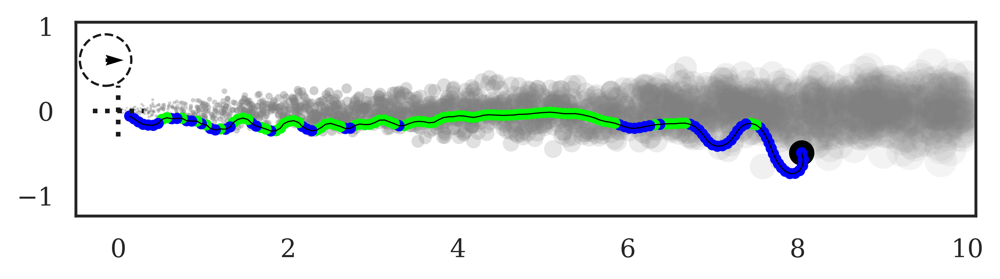

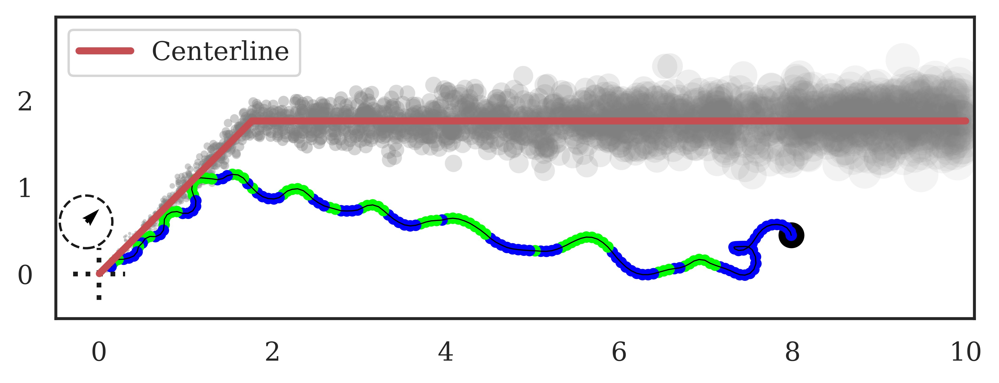

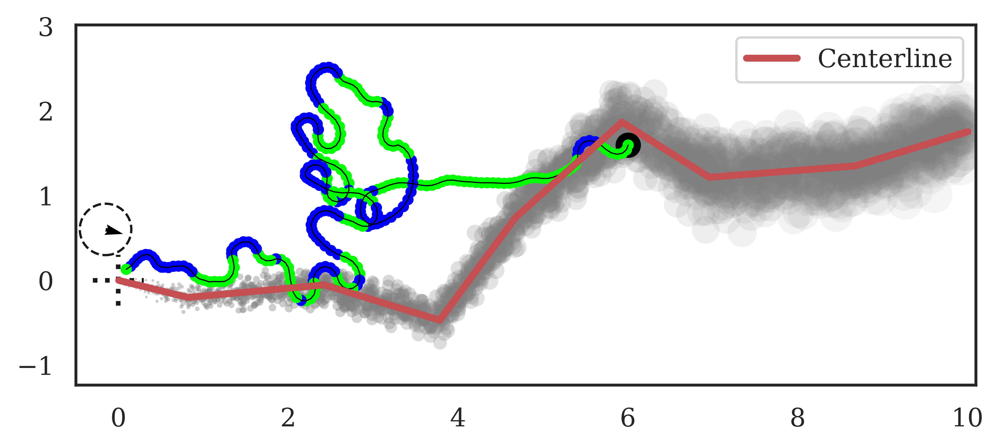

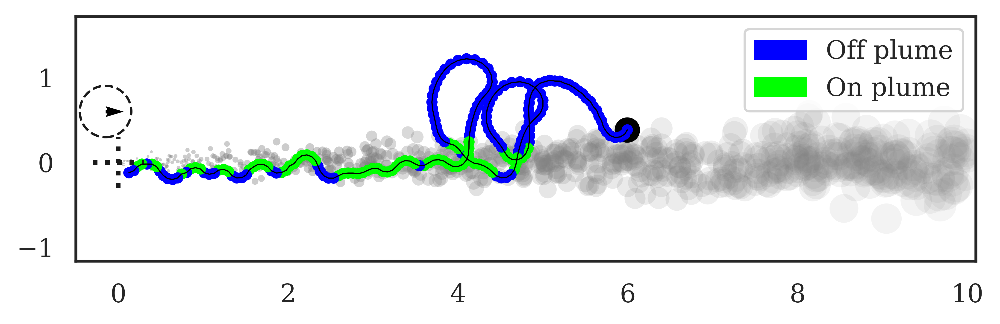

In [12]:
%config InlineBackend.figure_format = 'retina'
mpl.rcParams['figure.dpi'] = 360

importlib.reload(config)
importlib.reload(agent_analysis)
import sim_analysis
importlib.reload(sim_analysis)

forCosyne = True

for idx, row in ep_selected.iterrows():
#     print(row)
    model_seed = row['model_seed']
    dataset = row['dataset']
    birthx = row['birthx']
    idx = row['idx']
    task = dataset if birthx==1.0 else f"{dataset}_{birthx}"
#     print(task)

    subset = selected_df_all.query("outcome == 'HOME' and dataset == @task and model_seed == @model_seed and idx == @idx")
#     print(subset)
    logs = subset['log'].to_list()
    zoom = row['zoom']
    zoom = -1

    agent_analysis.visualize_episodes(logs, 
                                      zoom=zoom, 
                                      dataset=dataset,
                                      animate=False,
                                      plotsize=(7,7), 
                                      birthx=birthx,
                                     )
    
    if ('noisy3' in dataset or 'switch' in dataset) and forCosyne: # for cosyne abstract
        centerline_filename = f'{config.datadir}/centerline_data_{dataset}.pickle' 
        centerline_df = pd.read_pickle(centerline_filename)
        
        t_val = [record[0]['t_val'] for record in logs[0]['infos']][-1]
        tidx = int(t_val*100)
        centerline_t = centerline_df[ centerline_df.tidx == tidx ]
        plt.plot(centerline_t['x'], centerline_t['y'], lw=3, alpha=1.0, c='r', label='Centerline')
        plt.legend()


# subset =  selected_df_all.query("outcome == 'HOME' and dataset == @task and model_seed == '3307e9'").sample(5)
# subset =  selected_df_all.query("outcome == 'HOME' and dataset == @task").groupby(by='model_seed').sample(1)
# logs = subset['log'].to_list()
# idxs = subset['idx'].to_list()
# print(idxs)

# from matplotlib.lines import Line2D
handles, labels = plt.gca().get_legend_handles_labels()
patch1 = mpatches.Patch(color=config.traj_colormap['off'], label='Off plume')   
patch2 = mpatches.Patch(color=config.traj_colormap['on'], label='On plume')   
# line = Line2D([0], [0], label = 'manual line',color='b')
handles.extend([patch1, patch2])
# handles.extend([patch,line])
plt.legend(handles=handles)
plt.show()

In [13]:
# import matplotlib.pyplot as plt
# # red_patch = mpatches.Patch(color='lime', label='The red data')
# # blue_patch = mpatches.Patch(color='blue', label='The blue data')
# # plt.legend(handles=[red_patch, blue_patch])
# patch1 = mpatches.Patch(edgecolor='blue', facecolor='red', lw=3, label='Off plume')   
# patch2 = mpatches.Patch(edgecolor='lime', facecolor='red', lw=3, label='On plume')   
# line = Line2D([0], [0], label = 'manual line',color='blue', lw=4, mec='blue', mfc='red',)
# plt.legend(handles=[patch1, patch2, line])
# plt.show()

## Figure 2

In [14]:
# # Find a few good examples
# %config InlineBackend.figure_format = 'png'
# mpl.rcParams['figure.dpi'] = 100

# # importlib.reload(agent_analysis)
# # import sim_analysis
# # importlib.reload(sim_analysis)
# # dataset = 'switch45x5b5'
# # dataset = 'noisy3x5b5'
# dataset = 'constantx5b5'
# birthx = 1.0
# # # birthx = 0.4

# task = dataset if birthx==1.0 else f"{dataset}_{birthx}"
# subset =  selected_df_all.query("outcome != 'HOME' and dataset == @task and model_seed == '3307e9'").sample(5)
# # subset =  selected_df_all.query("outcome == 'HOME' and dataset == @task").groupby(by='model_seed').sample(1)
# logs = subset['log'].to_list()
# idxs = subset['idx'].to_list()
# print(idxs)
# agent_analysis.visualize_episodes(logs, 
#                                   zoom=2, 
#                                   dataset=dataset,
#                                   episode_idxs=idxs,
#                                   animate=False,
#                                   plotsize=(7,7), 
#                                   birthx=birthx,
#                                   colorby='regime'
#                                  )



seed specific thresholds 12 35
constantx5b5
seed specific thresholds 12 35
constantx5b5


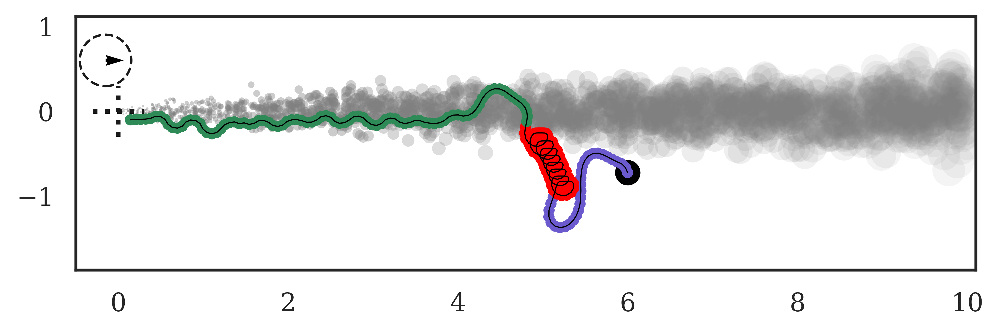

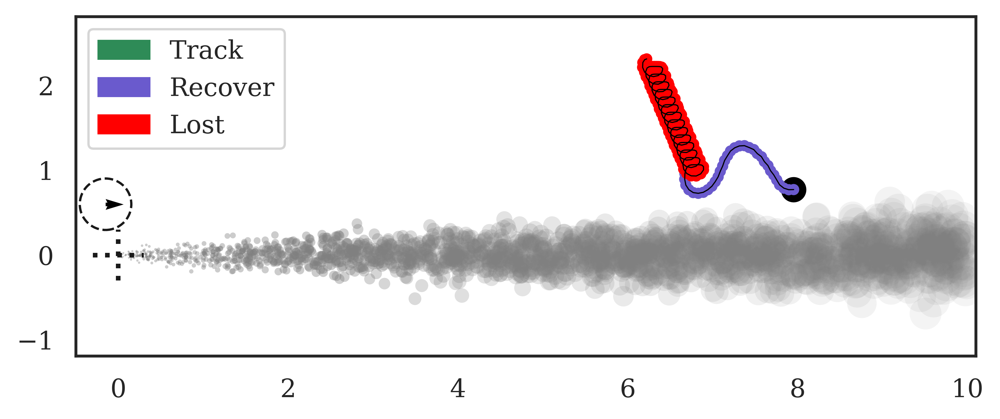

,dataset,model_seed,idx,birthx,zoom,outcome
0,constantx5b5,3307e9,130,1.0,1,HOME
1,constantx5b5,3307e9,189,1.0,1,OOB


In [15]:
ep_selected2 = [] # selected in above cell
ep_selected2.append({'dataset':'constantx5b5', 'model_seed':'3307e9', 
                    'idx':130, 'birthx':1.0, 'zoom':1, 'outcome': 'HOME'})
ep_selected2.append({'dataset':'constantx5b5', 'model_seed':'3307e9', 
                    'idx':189, 'birthx':1.0, 'zoom':1, 'outcome': 'OOB'})
ep_selected2 = pd.DataFrame(ep_selected2)


%config InlineBackend.figure_format = 'retina'
mpl.rcParams['figure.dpi'] = 360

importlib.reload(agent_analysis)
importlib.reload(sim_analysis)
importlib.reload(log_analysis)
importlib.reload(config)

for idx, row in ep_selected2.iterrows():
    model_seed = row['model_seed']
    dataset = row['dataset']
    birthx = row['birthx']
    idx = row['idx']
    outcome = row['outcome']
    task = dataset if birthx==1.0 else f"{dataset}_{birthx}"

    subset = selected_df_all.query("outcome == @outcome and dataset == @task and model_seed == @model_seed and idx == @idx")
#     print(subset)
    logs = subset['log'].to_list()
    zoom = row['zoom']
    zoom = -1
    
    viz_log = logs[0]
    traj_df = log_analysis.get_traj_df(viz_log, 
        extended_metadata=False, 
        squash_action=True,
        seed=model_seed)
    regime_colorby = log_analysis.regime_to_colors( traj_df['regime'].to_list() )


    agent_analysis.visualize_episodes(logs, 
                                      zoom=zoom, 
                                      dataset=dataset,
                                      animate=False,
                                      plotsize=(7,7), 
                                      birthx=birthx,
                                      colorby=regime_colorby,
#                                       colorby='regime',
                                     )
    
#     if outcome == 'HOME': # Add manually
#         plt.ylabel("Arena width [m]")
#         plt.xlabel("Arena length [m]")

# from matplotlib.lines import Line2D
handles, labels = plt.gca().get_legend_handles_labels()
patch1 = mpatches.Patch(color=regime_colormap['TRACK'], label='Track')   
patch2 = mpatches.Patch(color=regime_colormap['RECOVER'], label='Recover')   
patch3 = mpatches.Patch(color=regime_colormap['SEARCH'], label='Lost')   
# line = Line2D([0], [0], label = 'manual line',color='b')
# line = Line2D([0], [0], label = 'manual line',color='b')
handles.extend([patch1, patch2, patch3])
# handles.extend([patch,line])
plt.legend(handles=handles, loc='upper left')
plt.show()

ep_selected2

## Figure 6 - Dynamics associated with each Regime

seed specific thresholds 12 35
constantx5b5


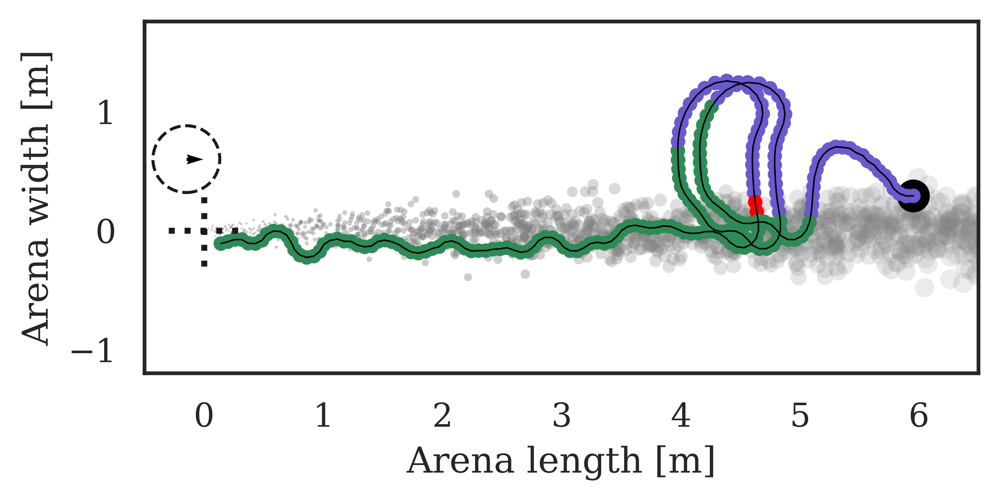

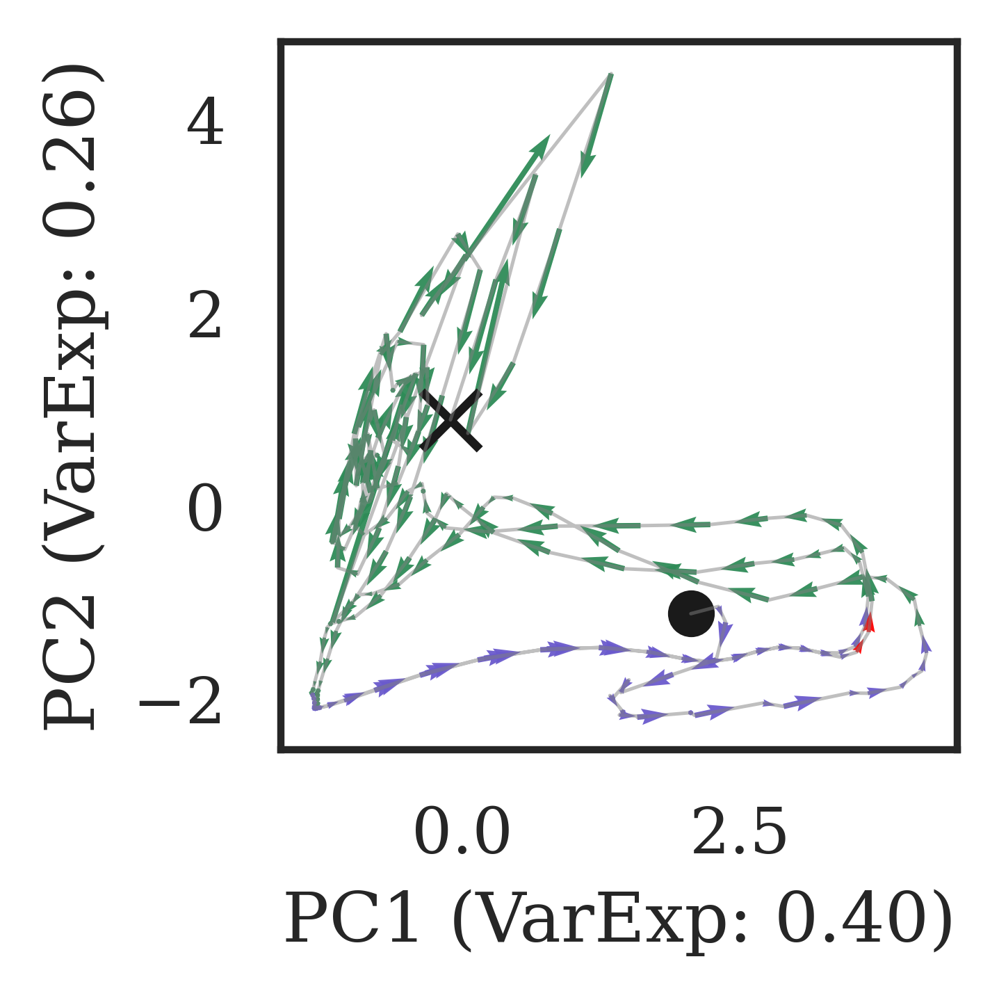

seed specific thresholds 12 35
constantx5b5


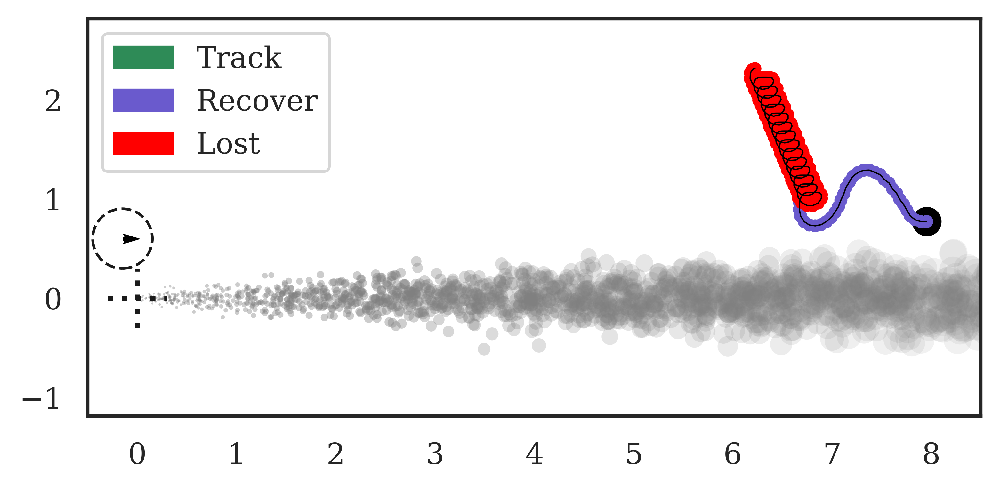

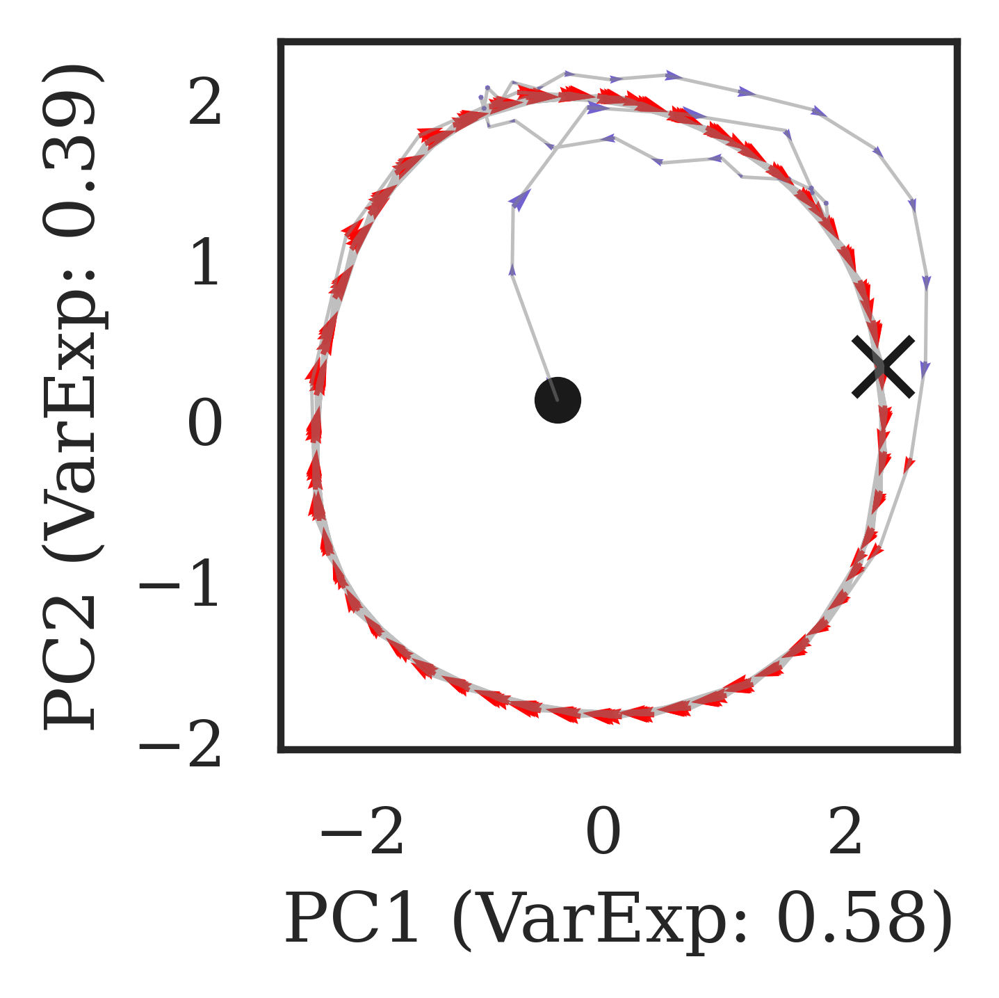

,dataset,model_seed,idx,birthx,zoom,outcome
0,constantx5b5,3307e9,108,1.0,1,HOME
1,constantx5b5,3307e9,189,1.0,1,OOB


In [16]:
ep_fig6 = []
ep_fig6.append({'dataset':'constantx5b5', 'model_seed':'3307e9', 
                    'idx':108, 'birthx':1.0, 'zoom':1, 'outcome': 'HOME'})
ep_fig6.append({'dataset':'constantx5b5', 'model_seed':'3307e9', 
                    'idx':189, 'birthx':1.0, 'zoom':1, 'outcome': 'OOB'})
ep_fig6 = pd.DataFrame(ep_fig6)


%config InlineBackend.figure_format = 'retina'
mpl.rcParams['figure.dpi'] = 300

importlib.reload(agent_analysis)
import sim_analysis
importlib.reload(sim_analysis)
importlib.reload(config)

for idx, row in ep_fig6.iterrows():
    model_seed = row['model_seed']
    dataset = row['dataset']
    birthx = row['birthx']
    idx = row['idx']
    outcome = row['outcome']
    task = dataset if birthx==1.0 else f"{dataset}_{birthx}"

    subset = selected_df_all.query("outcome == @outcome and dataset == @task and model_seed == @model_seed and idx == @idx")
#     print(subset)
    logs = subset['log'].to_list()
    zoom = row['zoom']
    zoom = -1
    
    traj_df = log_analysis.get_traj_df(logs[0], 
            extended_metadata=True, 
            squash_action=True, 
            seed=model_seed,
          )
    regime_colorby = log_analysis.regime_to_colors( traj_df['regime'].to_list() )




    agent_analysis.visualize_episodes(logs, 
                                      zoom=zoom, 
                                      dataset=dataset,
                                      animate=False,
                                      plotsize=(5,5) if outcome == 'HOME' else (6,6), 
                                      birthx=birthx,
                                      colorby=regime_colorby,
#                                       colorby='regime',
                                     )
    
    if outcome == 'HOME':
        plt.xlim(-0.5, 6.5)
        plt.ylabel("Arena width [m]")
        plt.xlabel("Arena length [m]")
    else:
        plt.xlim(-0.5, 8.5)
        # from matplotlib.lines import Line2D
        handles, labels = plt.gca().get_legend_handles_labels()
        patch1 = mpatches.Patch(color=regime_colormap['TRACK'], label='Track')   
        patch2 = mpatches.Patch(color=regime_colormap['RECOVER'], label='Recover')   
        patch3 = mpatches.Patch(color=regime_colormap['SEARCH'], label='Lost')   

        # line = Line2D([0], [0], label = 'manual line',color='b')
        # line = Line2D([0], [0], label = 'manual line',color='b')
        handles.extend([patch1, patch2, patch3])
        # handles.extend([patch,line])
        plt.legend(handles=handles, loc='upper left')
        plt.show()
        
    # Neural activity
    colname = 'regime'

    ep_activity = np.array(pd.DataFrame(logs[0]['activity'])['rnn_hxs'].to_list())
    pca = skld.PCA(3, whiten=False)
    if outcome == 'HOME':
        pca.fit(ep_activity[ (traj_df['regime'] == 'TRACK').to_numpy(),: ]  )
    else:
        pca.fit(ep_activity[ (traj_df['regime'] == 'SEARCH').to_numpy(),: ]  )    
    X_pca = pca.transform(ep_activity)

    # Plot 2D
#     fig = plt.figure(figsize=(3,3))
#     ax = fig.gca()
#     ax.plot(X_pca[:, 0], X_pca[:, 1],  linewidth=0.6, c='grey', alpha=0.5)
#     colors = [config.regime_colormap[x] for x in traj_df[colname]]
#     sc = ax.scatter(X_pca[:, 0], X_pca[:, 1],
#             s=20, c=colors, cmap=plt.cm.get_cmap('RdBu'), vmin=0., vmax=1.)
#     ax.scatter(X_pca[0, 0], X_pca[0, 1], c='k', marker='o', s=100) # Start
#     ax.scatter(X_pca[-1, 0], X_pca[-1, 1], c='k', marker='x', s=200) # End
#     ax.set_xlabel(f'PC1 (VarExp: {pca.explained_variance_ratio_[0]:0.2f})')
#     ax.set_ylabel(f'PC2 (VarExp: {pca.explained_variance_ratio_[1]:0.2f})')
# #     ax.set_aspect('equal')    
#     plt.tight_layout()
#     plt.show()

    # Quiver 2D
    fig = plt.figure(figsize=(2.5,2.5))
    ax = fig.gca()
    U = X_pca[1:, 0] - X_pca[:-1, 0]
    V = X_pca[1:, 1] - X_pca[:-1, 1]
    colors = [config.regime_colormap[x] for x in traj_df[colname].iloc[:-1]]
    ax.plot(X_pca[:, 0], X_pca[:, 1],  linewidth=0.6, c='grey', alpha=0.5)
    ax.quiver(X_pca[:-1, 0], X_pca[:-1, 1], U, V,
              width=0.008,
              color=colors, alpha=0.95)
    ax.scatter(X_pca[0, 0], X_pca[0, 1], c='k', marker='o', s=50) # Start
    ax.scatter(X_pca[-1, 0], X_pca[-1, 1], c='k', marker='x', s=100) # End
    ax.set_xlabel(f'PC1 (VarExp: {pca.explained_variance_ratio_[0]:0.2f})')
    ax.set_ylabel(f'PC2 (VarExp: {pca.explained_variance_ratio_[1]:0.2f})')
    plt.tight_layout()
    plt.show()


    
    # Plot 3D
#     fig = plt.figure(figsize=(4,4))
#     ax = fig.gca(projection='3d')
#     ax.plot(X_pca[:, 0], X_pca[:, 1],  linewidth=0.6, c='grey', alpha=0.5)
#     colors = [config.regime_colormap[x] for x in traj_df[colname]]
#     ax.plot(X_pca[:, 0], X_pca[:, 1], X_pca[:, 2], linewidth=0.6, c='grey', alpha=0.5)
#     sc = ax.scatter(X_pca[:, 0], X_pca[:, 1], X_pca[:, 2], 
#             s=20, c=colors, vmin=0, vmax=1)
#     ax.scatter(X_pca[0, 0], X_pca[0, 1], X_pca[0, 2], c='k', marker='o', s=100) # Start
#     ax.scatter(X_pca[-1, 0], X_pca[-1, 1], X_pca[-1, 2], c='k', marker='x', s=150) # End
#     ax.set_xlabel(f'PC1 (VarExp: {pca.explained_variance_ratio_[0]:0.2f})')
#     ax.set_ylabel(f'PC2 (VarExp: {pca.explained_variance_ratio_[1]:0.2f})')
#     ax.set_zlabel(f'PC3 (VarExp: {pca.explained_variance_ratio_[2]:0.2f})')
#     print(f'ax.elev: {ax.elev}, ax.azim {ax.azim}') # Get original rotation
#     if outcome == 'HOME':
#         ax.view_init(30, 30)
#         ax.set_xlim(-1, 3.5)
#     plt.tight_layout()
#     plt.show()


ep_fig6

seed specific thresholds 12 35
constantx5b5
Saving: /home/satsingh/plume/plumezoo/latest/fly/memory//report_common_subspace//regime_traj_3307e9_HOME_108.png


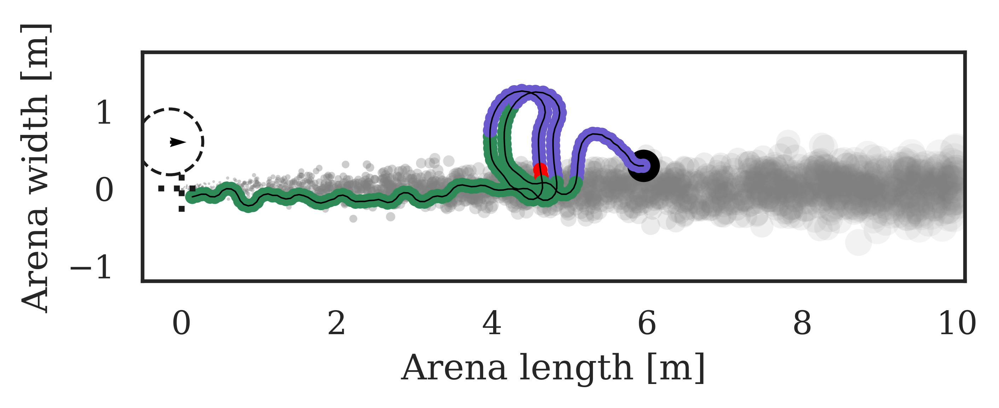

Saving: /home/satsingh/plume/plumezoo/latest/fly/memory//report_common_subspace//regime_neural_3307e9_HOME_108.png


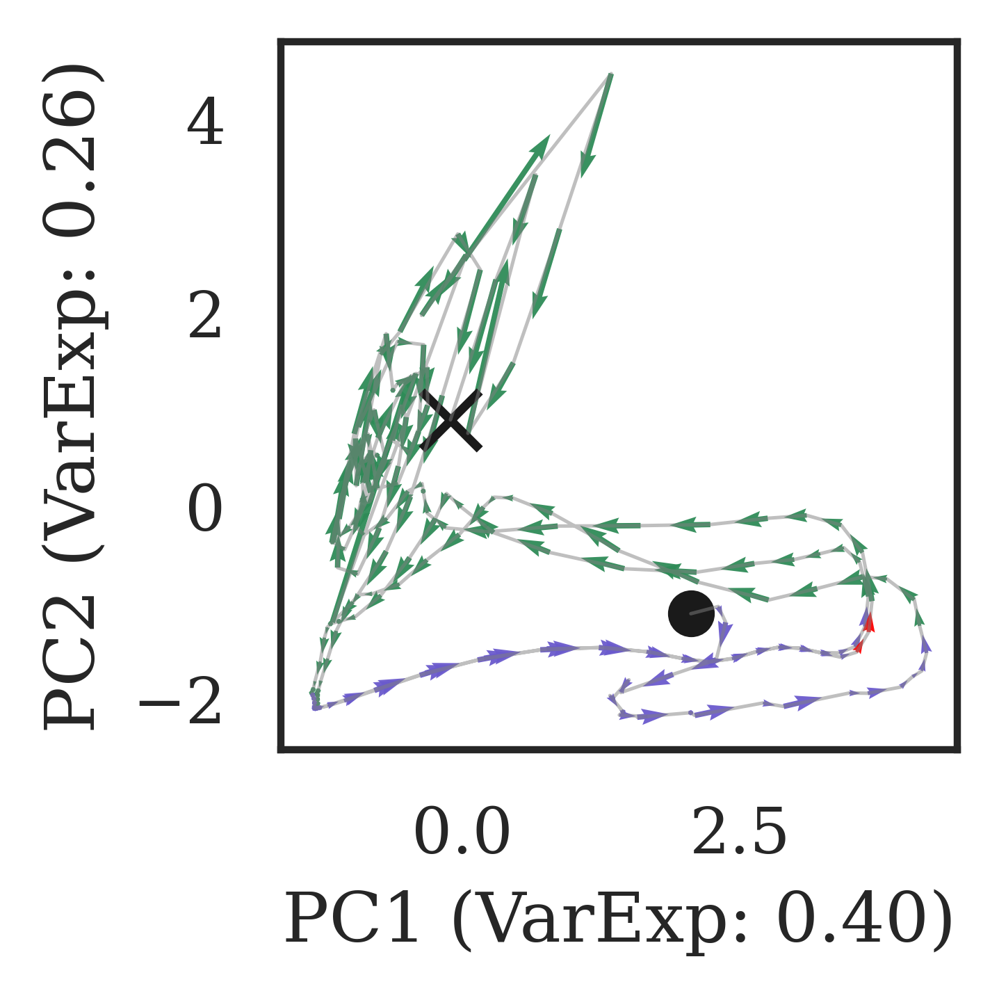

seed specific thresholds 12 35
constantx5b5
Saving: /home/satsingh/plume/plumezoo/latest/fly/memory//report_common_subspace//regime_traj_3307e9_OOB_189.png


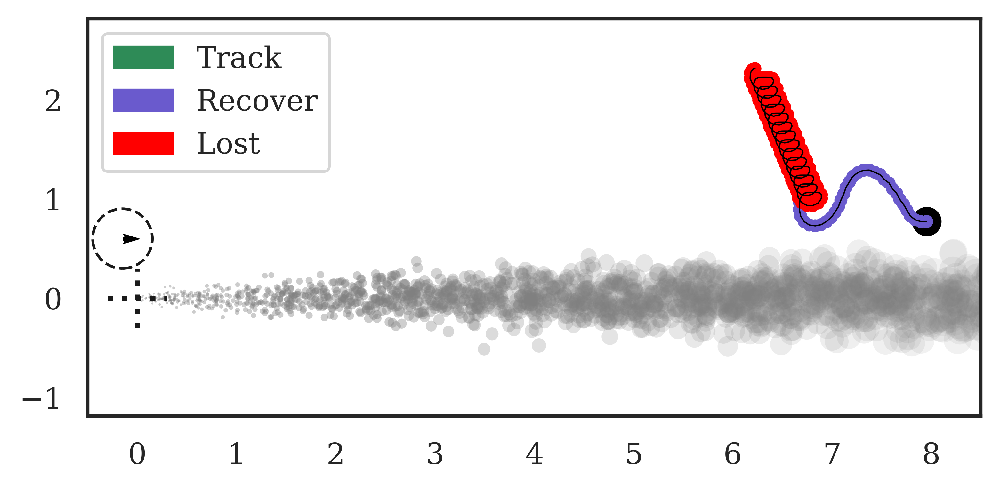

Saving: /home/satsingh/plume/plumezoo/latest/fly/memory//report_common_subspace//regime_neural_3307e9_OOB_189.png


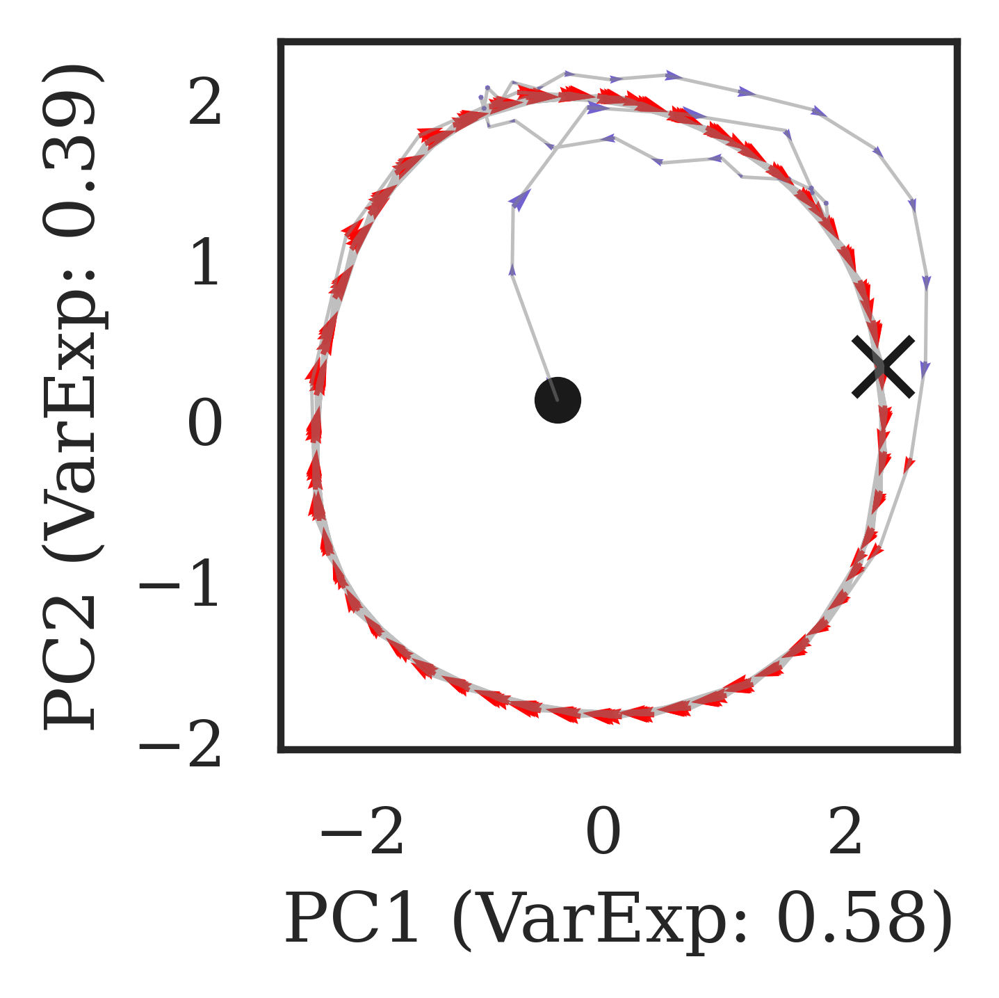

constantx5b5
Saving: /home/satsingh/plume/plumezoo/latest/fly/memory//report_common_subspace//regime_traj_9781ba_HOME_196.png


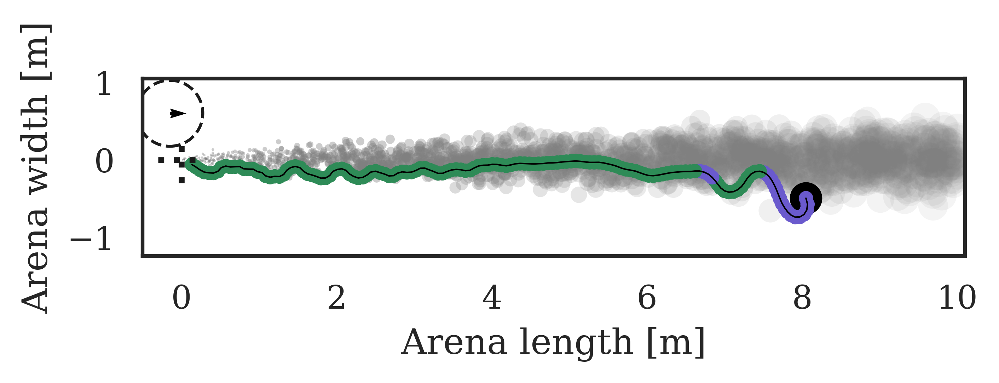

Saving: /home/satsingh/plume/plumezoo/latest/fly/memory//report_common_subspace//regime_neural_9781ba_HOME_196.png


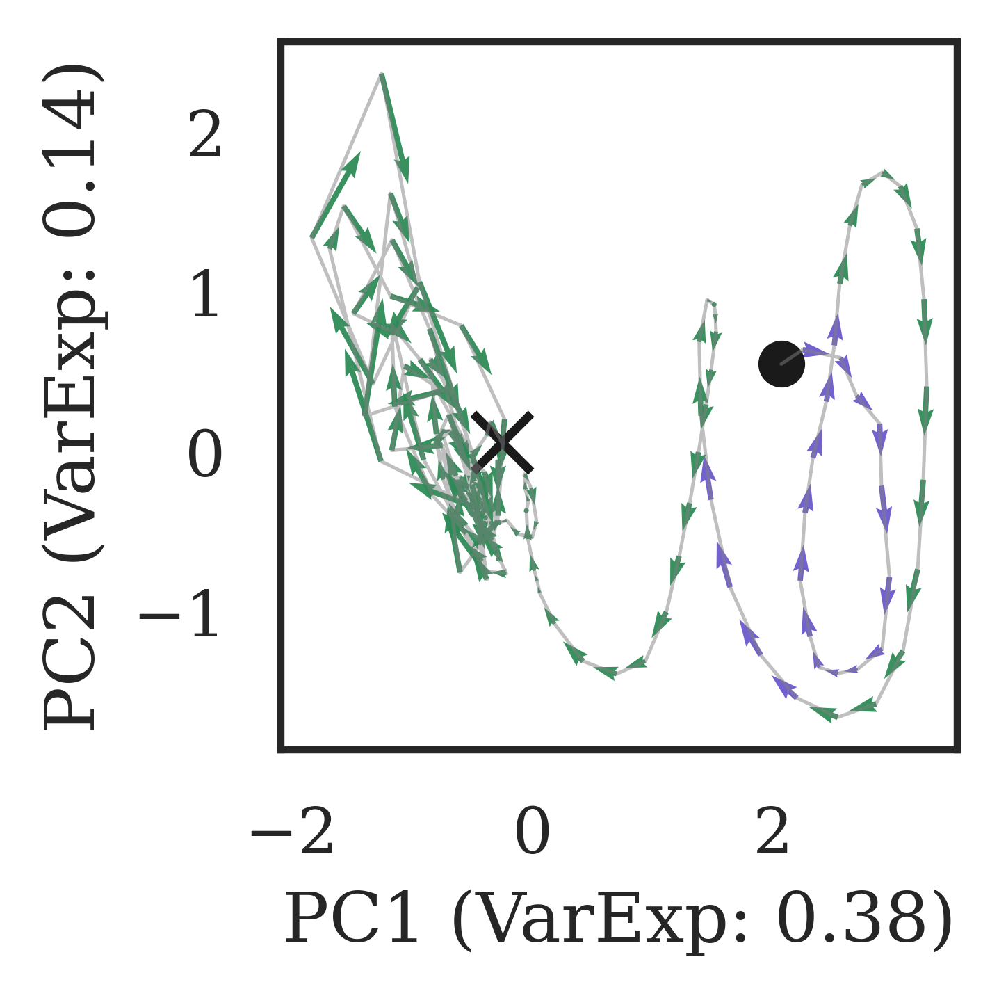

constantx5b5
Saving: /home/satsingh/plume/plumezoo/latest/fly/memory//report_common_subspace//regime_traj_9781ba_OOB_130.png


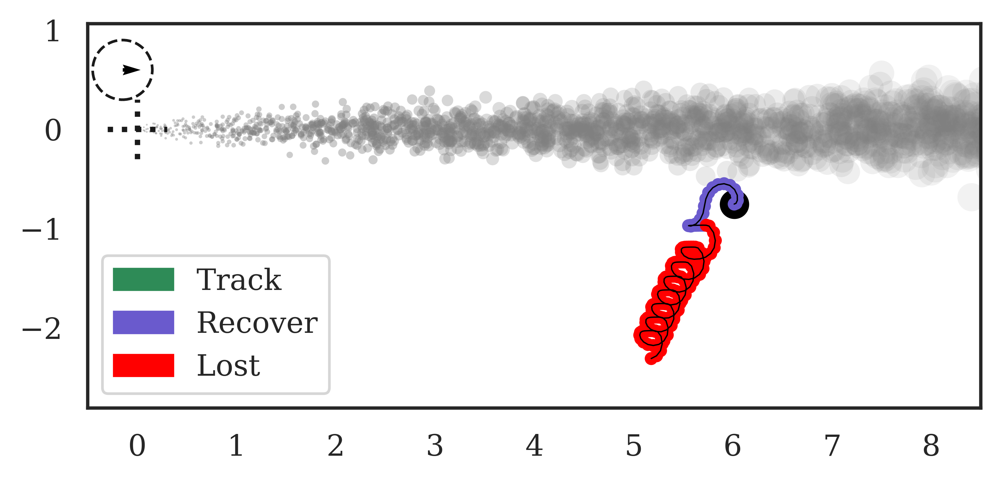

Saving: /home/satsingh/plume/plumezoo/latest/fly/memory//report_common_subspace//regime_neural_9781ba_OOB_130.png


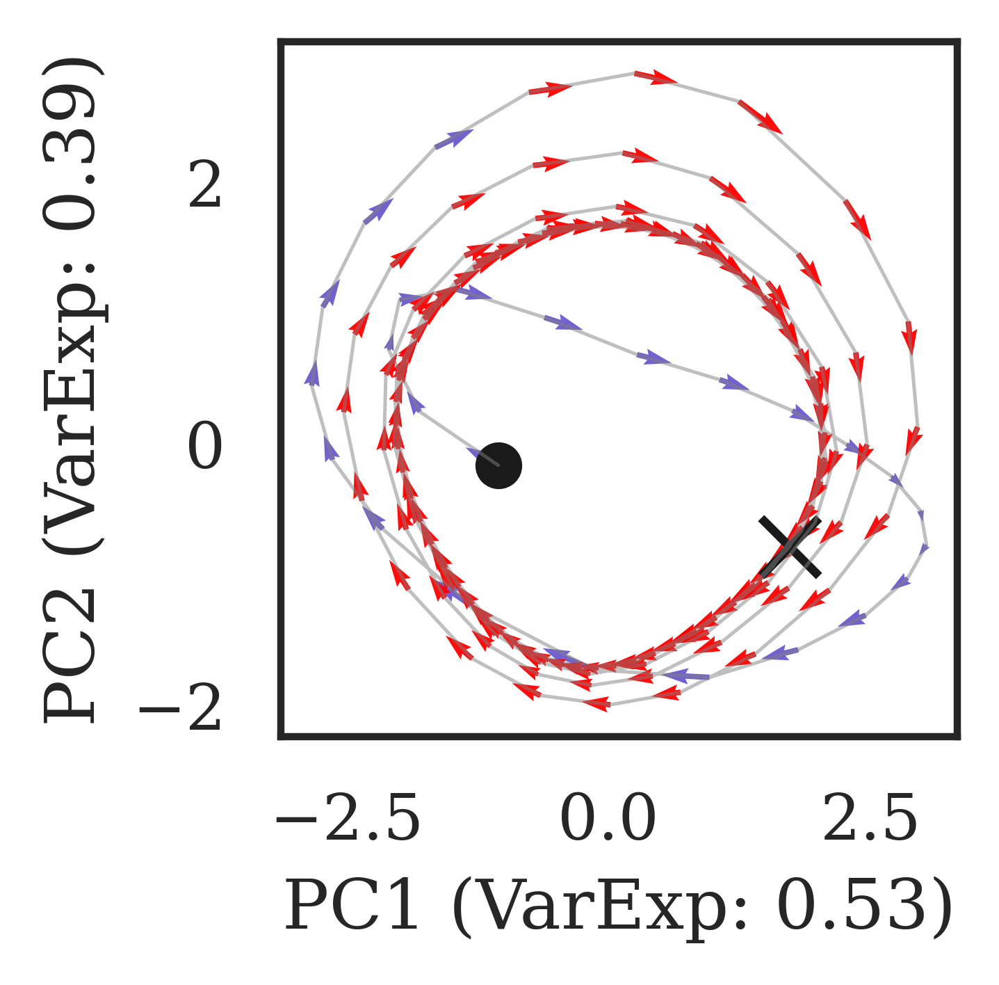

seed specific thresholds 12 38
constantx5b5
Saving: /home/satsingh/plume/plumezoo/latest/fly/memory//report_common_subspace//regime_traj_541058_HOME_165.png


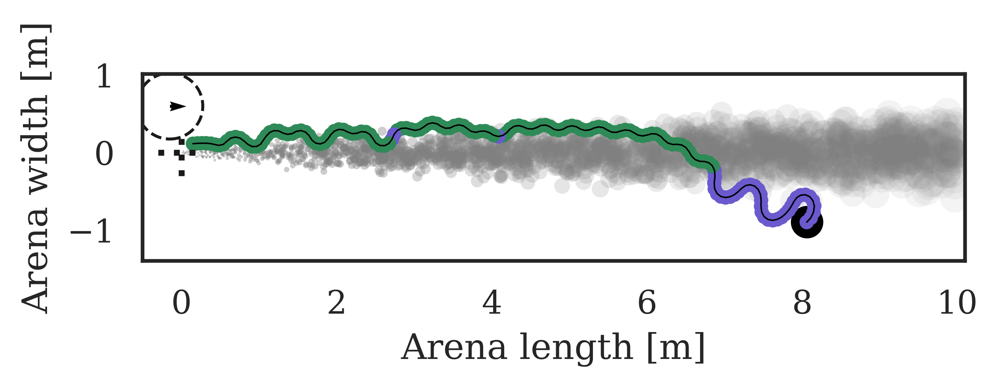

Saving: /home/satsingh/plume/plumezoo/latest/fly/memory//report_common_subspace//regime_neural_541058_HOME_165.png


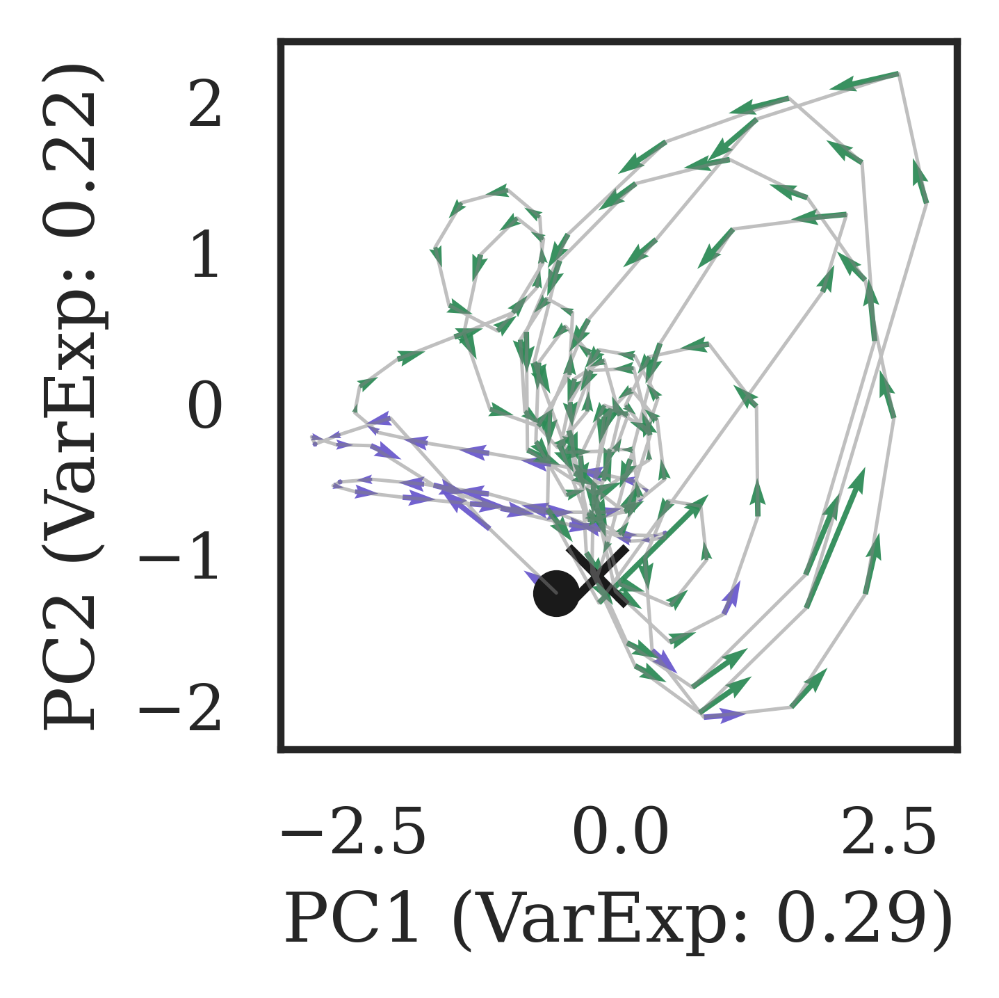

seed specific thresholds 12 38
constantx5b5
Saving: /home/satsingh/plume/plumezoo/latest/fly/memory//report_common_subspace//regime_traj_541058_OOB_103.png


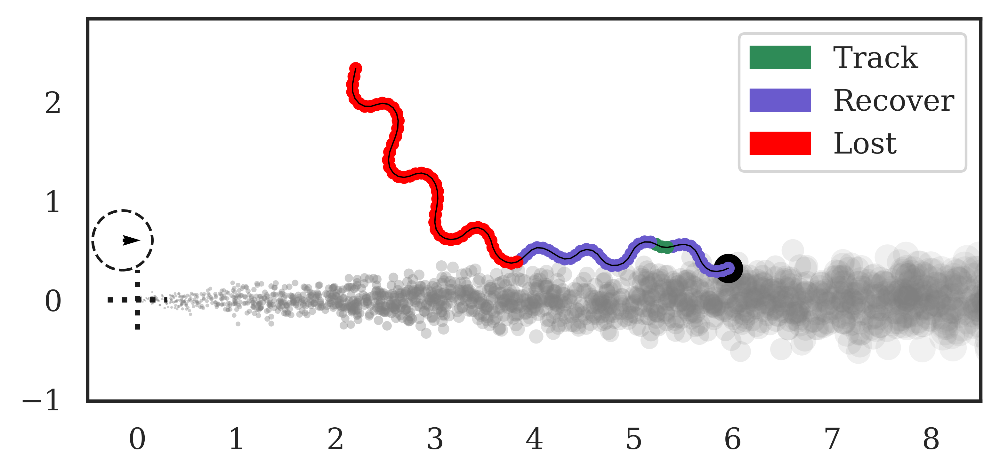

Saving: /home/satsingh/plume/plumezoo/latest/fly/memory//report_common_subspace//regime_neural_541058_OOB_103.png


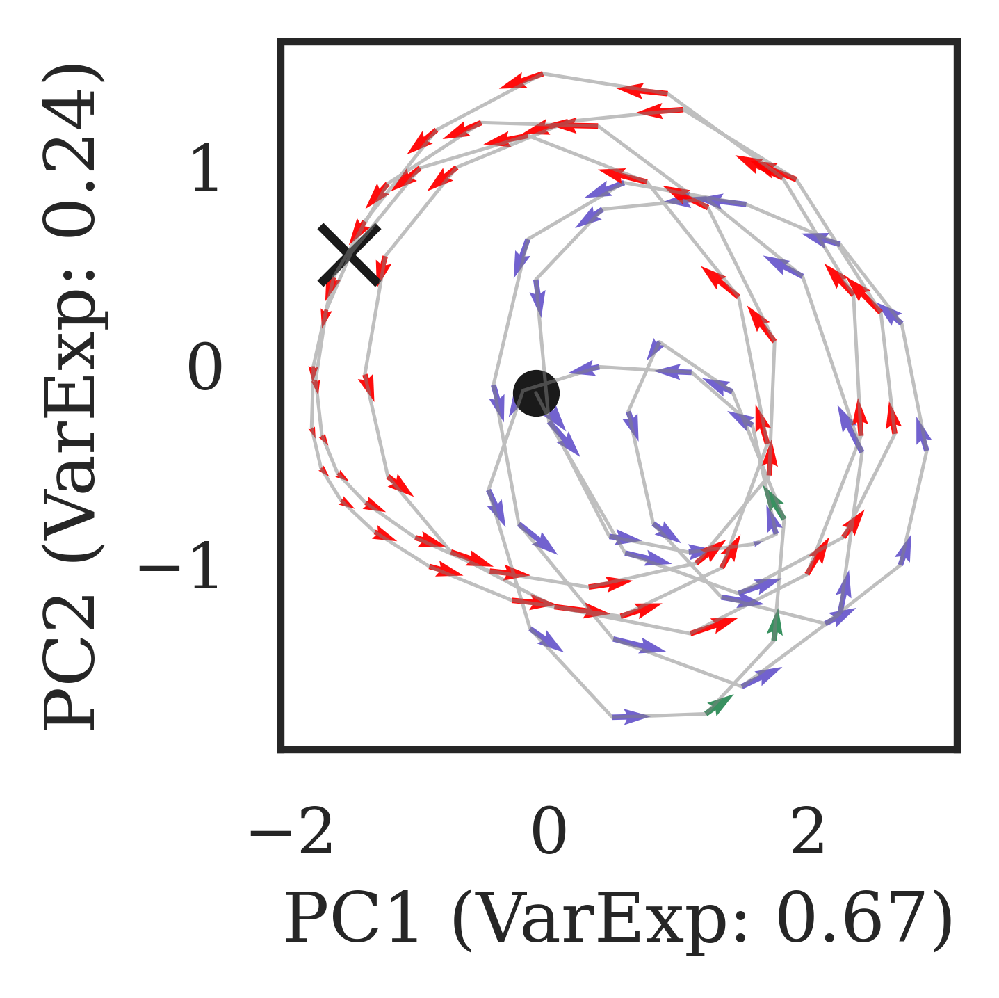

seed specific thresholds 12 30
constantx5b5
Saving: /home/satsingh/plume/plumezoo/latest/fly/memory//report_common_subspace//regime_traj_2760377_HOME_148.png


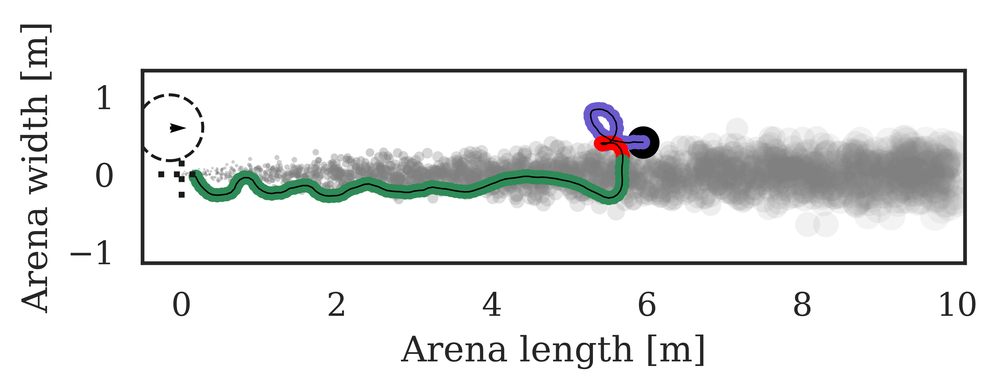

Saving: /home/satsingh/plume/plumezoo/latest/fly/memory//report_common_subspace//regime_neural_2760377_HOME_148.png


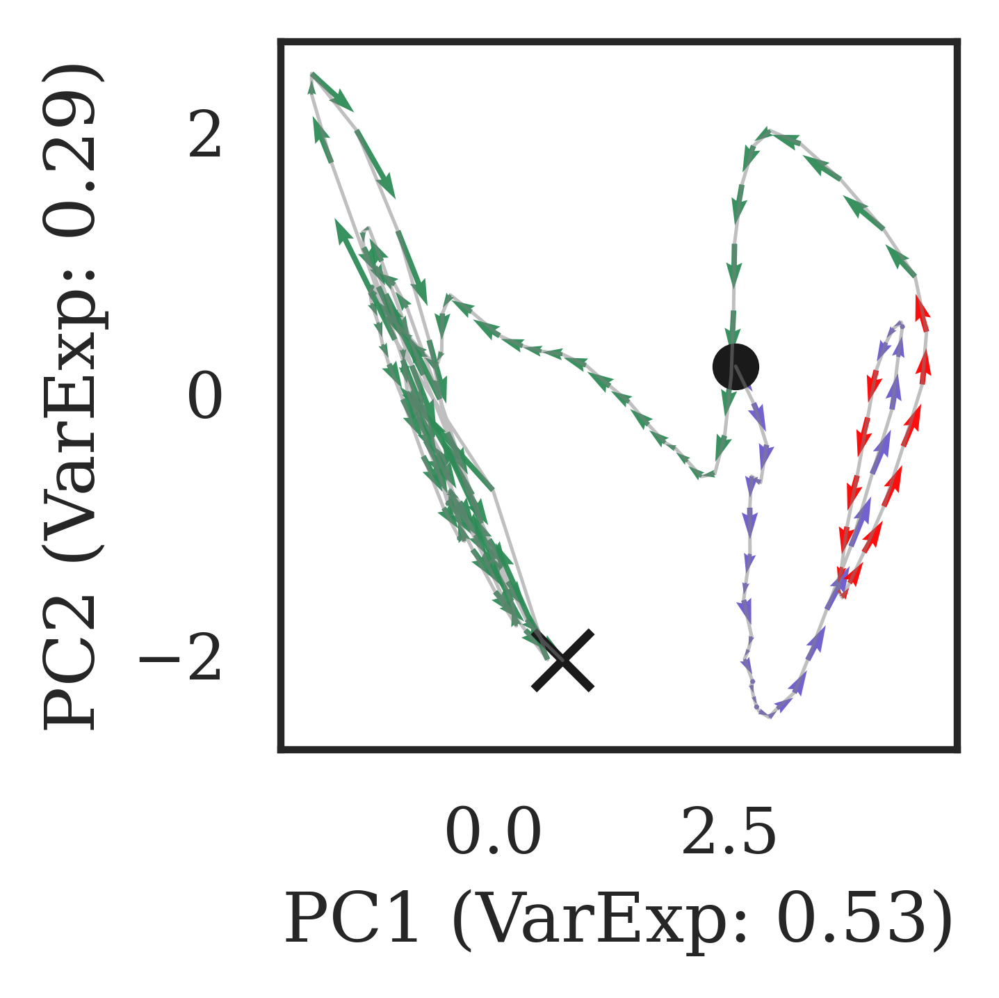

seed specific thresholds 12 30
constantx5b5
Saving: /home/satsingh/plume/plumezoo/latest/fly/memory//report_common_subspace//regime_traj_2760377_OOB_136.png


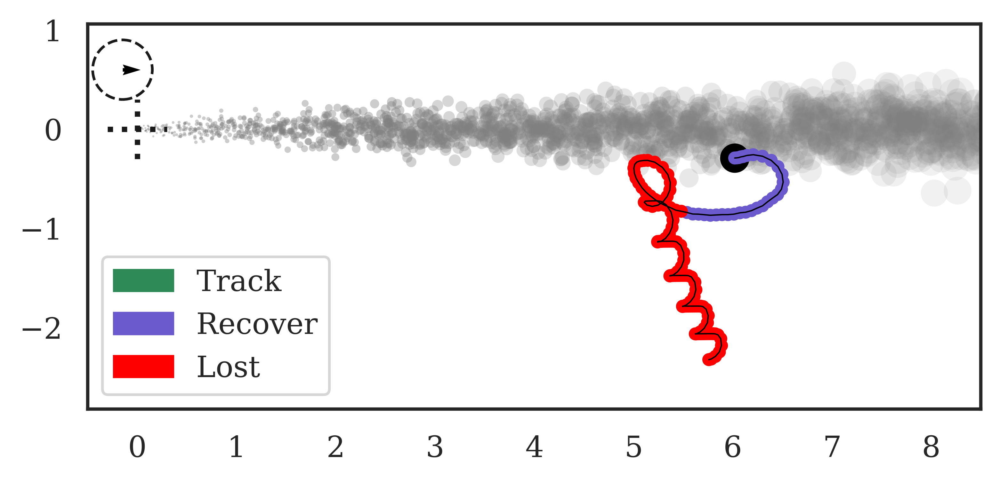

Saving: /home/satsingh/plume/plumezoo/latest/fly/memory//report_common_subspace//regime_neural_2760377_OOB_136.png


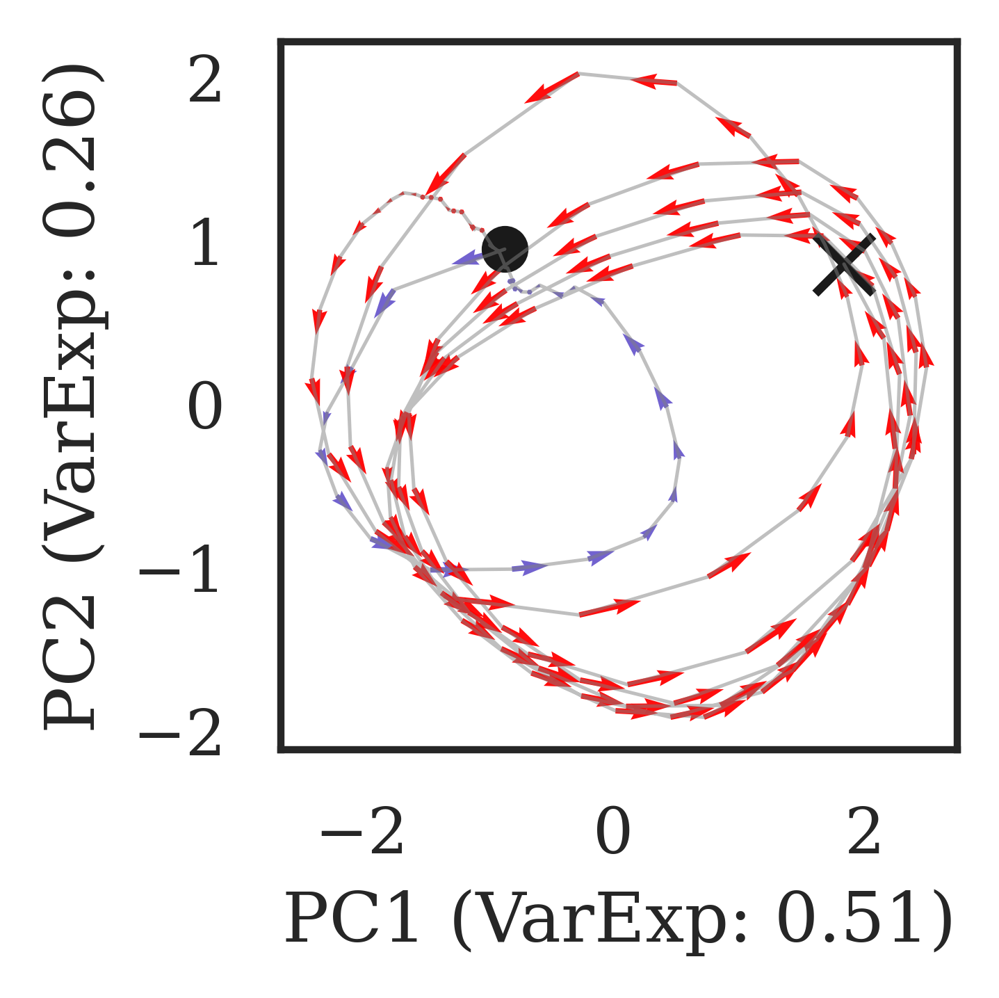

constantx5b5
Saving: /home/satsingh/plume/plumezoo/latest/fly/memory//report_common_subspace//regime_traj_3199993_HOME_161.png


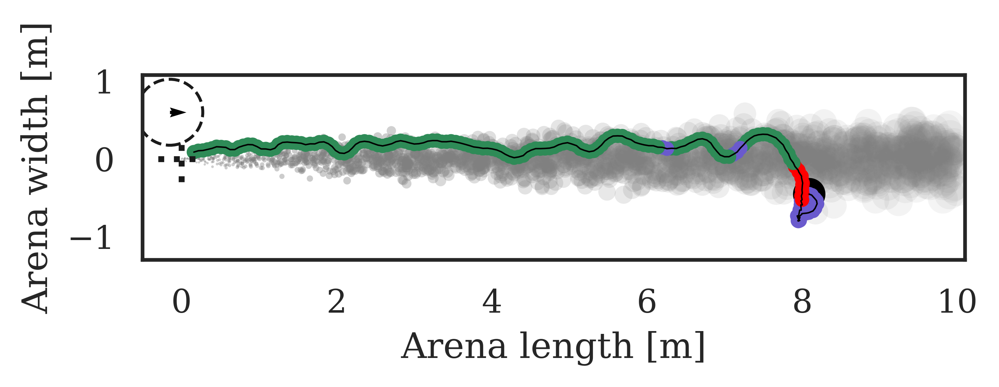

Saving: /home/satsingh/plume/plumezoo/latest/fly/memory//report_common_subspace//regime_neural_3199993_HOME_161.png


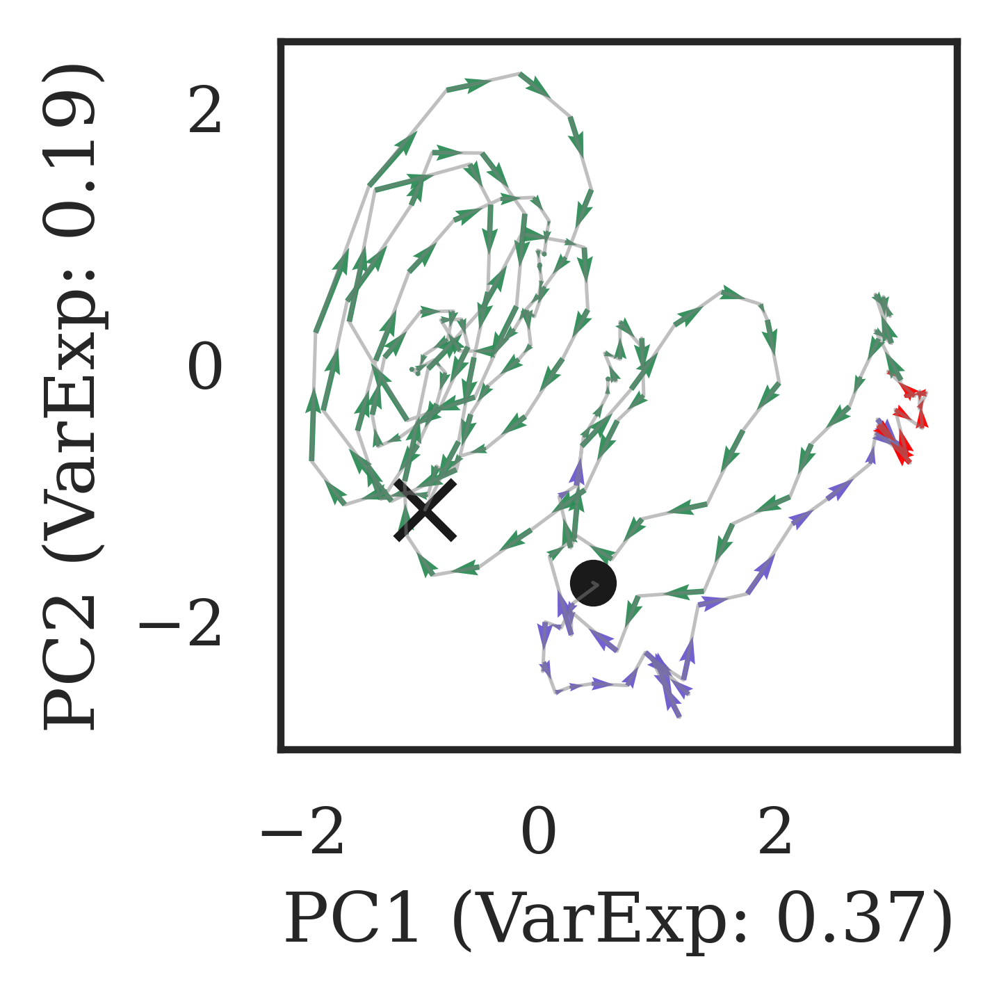

constantx5b5
Saving: /home/satsingh/plume/plumezoo/latest/fly/memory//report_common_subspace//regime_traj_3199993_OOB_144.png


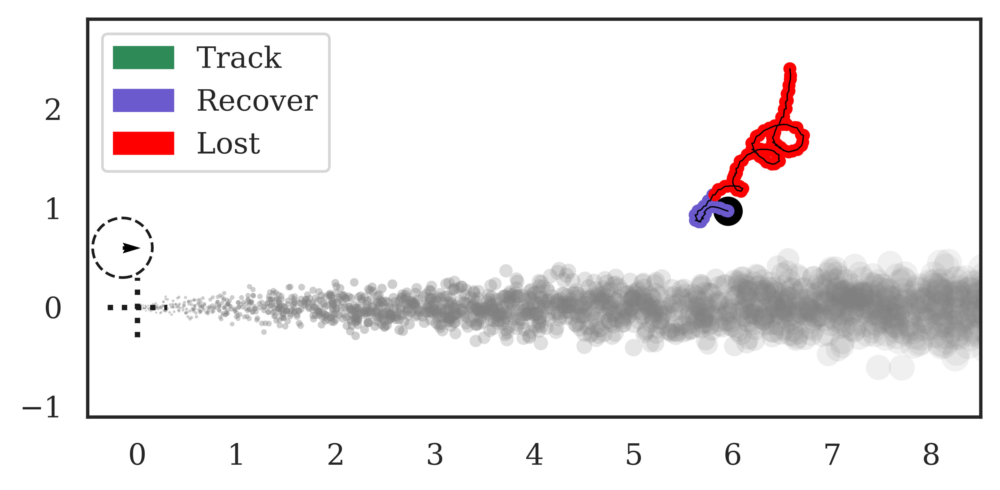

Saving: /home/satsingh/plume/plumezoo/latest/fly/memory//report_common_subspace//regime_neural_3199993_OOB_144.png


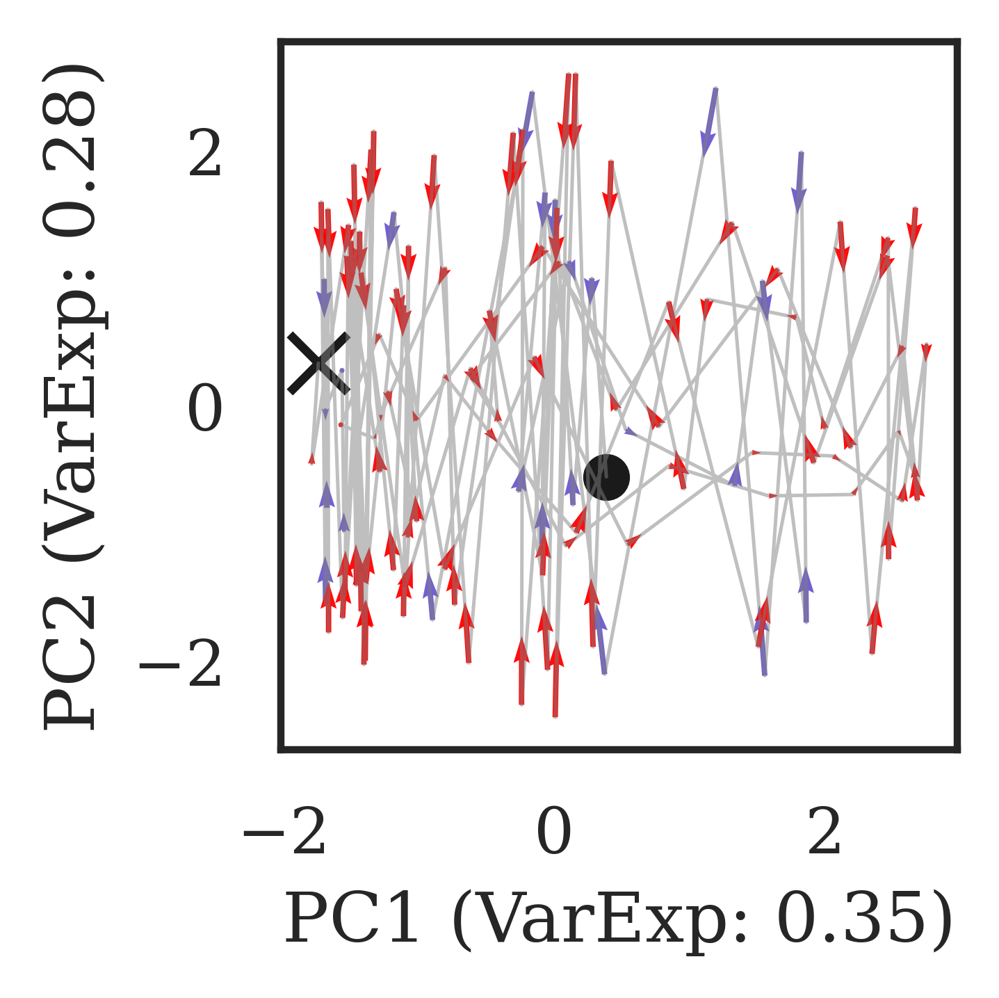

In [17]:
# Fig 6 appendices
%config InlineBackend.figure_format = 'retina'
mpl.rcParams['figure.dpi'] = 300

importlib.reload(agent_analysis)
import sim_analysis
importlib.reload(sim_analysis)
importlib.reload(config)

# Random sample
ep_fig6_appendix = selected_df_all.query("dataset == 'constantx5b5'").groupby(by=["model_seed", "outcome",]).sample(1)
# Used in manuscript
ep_fig6_appendix = []
ep_fig6_appendix.append({'dataset':'constantx5b5', 'model_seed':'3307e9', 
                    'idx':108, 'birthx':1.0, 'zoom':1, 'outcome': 'HOME'})
ep_fig6_appendix.append({'dataset':'constantx5b5', 'model_seed':'3307e9', 
                    'idx':189, 'birthx':1.0, 'zoom':1, 'outcome': 'OOB'})

ep_fig6_appendix.append({'dataset':'constantx5b5', 'model_seed':'9781ba', 
                    'idx':196, 'birthx':1.0, 'zoom':1, 'outcome': 'HOME'})
ep_fig6_appendix.append({'dataset':'constantx5b5', 'model_seed':'9781ba', 
                    'idx':130, 'birthx':1.0, 'zoom':1, 'outcome': 'OOB'})

ep_fig6_appendix.append({'dataset':'constantx5b5', 'model_seed':'541058', 
                    'idx':165, 'birthx':1.0, 'zoom':1, 'outcome': 'HOME'})
ep_fig6_appendix.append({'dataset':'constantx5b5', 'model_seed':'541058', 
                    'idx':103, 'birthx':1.0, 'zoom':1, 'outcome': 'OOB'})

ep_fig6_appendix.append({'dataset':'constantx5b5', 'model_seed':'2760377', 
                    'idx':148, 'birthx':1.0, 'zoom':1, 'outcome': 'HOME'})
ep_fig6_appendix.append({'dataset':'constantx5b5', 'model_seed':'2760377', 
                    'idx':136, 'birthx':1.0, 'zoom':1, 'outcome': 'OOB'})

ep_fig6_appendix.append({'dataset':'constantx5b5', 'model_seed':'3199993', 
                    'idx':161, 'birthx':1.0, 'zoom':1, 'outcome': 'HOME'})
ep_fig6_appendix.append({'dataset':'constantx5b5', 'model_seed':'3199993', 
                    'idx':144, 'birthx':1.0, 'zoom':1, 'outcome': 'OOB'})





ep_fig6_appendix = pd.DataFrame(ep_fig6_appendix)




for idx, row in ep_fig6_appendix.iterrows():
    model_seed = row['model_seed']
    dataset = row['dataset']
    birthx = 1.0
    idx = row['idx']
    outcome = row['outcome']
    task = dataset if birthx==1.0 else f"{dataset}_{birthx}"

    subset = selected_df_all.query("outcome == @outcome and dataset == @task and model_seed == @model_seed and idx == @idx")
#     print(subset)
    logs = subset['log'].to_list()
#     zoom = row['zoom']
    zoom = -1
    
    traj_df = log_analysis.get_traj_df(logs[0], 
            extended_metadata=True, 
            squash_action=True, 
            seed=model_seed,
          )
    regime_colorby = log_analysis.regime_to_colors( traj_df['regime'].to_list() )




    agent_analysis.visualize_episodes(logs, 
                                      zoom=zoom, 
                                      dataset=dataset,
                                      animate=False,
                                      plotsize=(5,5) if outcome == 'HOME' else (6,6), 
                                      birthx=birthx,
                                      colorby=regime_colorby,
#                                       colorby='regime',
                                     )
    
    if outcome == 'HOME':
#         plt.xlim(-0.5, 6.5)
        plt.ylabel("Arena width [m]")
        plt.xlabel("Arena length [m]")
    else:
        plt.xlim(-0.5, 8.5)
        # from matplotlib.lines import Line2D
        handles, labels = plt.gca().get_legend_handles_labels()
        patch1 = mpatches.Patch(color=regime_colormap['TRACK'], label='Track')   
        patch2 = mpatches.Patch(color=regime_colormap['RECOVER'], label='Recover')   
        patch3 = mpatches.Patch(color=regime_colormap['SEARCH'], label='Lost')   

        # line = Line2D([0], [0], label = 'manual line',color='b')
        # line = Line2D([0], [0], label = 'manual line',color='b')
        handles.extend([patch1, patch2, patch3])
        # handles.extend([patch,line])
        plt.legend(handles=handles, loc='best')
    
    fname = f"{outdir}/regime_traj_{model_seed}_{outcome}_{idx}.png"
    print("Saving:", fname)
    plt.savefig(fname, dpi=dpi_save, bbox_inches='tight', transparent=True)
    plt.show()
        
    # Neural activity
    colname = 'regime'

    ep_activity = np.array(pd.DataFrame(logs[0]['activity'])['rnn_hxs'].to_list())
    pca = skld.PCA(3, whiten=False)
    if outcome == 'HOME':
        pca.fit(ep_activity[ (traj_df['regime'] == 'TRACK').to_numpy(),: ]  )
    else:
        pca.fit(ep_activity[ (traj_df['regime'] == 'SEARCH').to_numpy(),: ]  )    
    X_pca = pca.transform(ep_activity)

    # Quiver 2D
    fig = plt.figure(figsize=(2.5,2.5))
    ax = fig.gca()
    U = X_pca[1:, 0] - X_pca[:-1, 0]
    V = X_pca[1:, 1] - X_pca[:-1, 1]
    colors = [config.regime_colormap[x] for x in traj_df[colname].iloc[:-1]]
    ax.plot(X_pca[:, 0], X_pca[:, 1],  linewidth=0.6, c='grey', alpha=0.5)
    ax.quiver(X_pca[:-1, 0], X_pca[:-1, 1], U, V,
              width=0.008,
              color=colors, alpha=0.95)
    ax.scatter(X_pca[0, 0], X_pca[0, 1], c='k', marker='o', s=50) # Start
    ax.scatter(X_pca[-1, 0], X_pca[-1, 1], c='k', marker='x', s=100) # End
    ax.set_xlabel(f'PC1 (VarExp: {pca.explained_variance_ratio_[0]:0.2f})')
    ax.set_ylabel(f'PC2 (VarExp: {pca.explained_variance_ratio_[1]:0.2f})')
    plt.tight_layout()
    fname = f"{outdir}/regime_neural_{model_seed}_{outcome}_{idx}.png"
    print("Saving:", fname)
    plt.savefig(fname, dpi=dpi_save, bbox_inches='tight', transparent=True)
    plt.show()


In [18]:
# (traj_df['regime'] == 'TRACK').to_numpy().flatten()
# np.array(ep_activity).shape, traj_df.shape

## Figure 7 TTCS

In [19]:
model_seed = '3307e9'
model_dir = '/home/satsingh/plume/plumezoo/latest/fly/memory/plume_20210601_VRNN_constantx5b5noisy3x5b5_stepoob_bx0.30.8_t10000004000000_q2.00.5_dmx0.80.8_dmn0.70.4_h64_wd0.0001_n4_codeVRNN_seed3307e9/'
comsubdir = f'{model_dir}/report_common_subspace/'
# ttcs_df = pd.read_csv(f"{comsubdir}/ttcs_swarm_{model_seed}.csv")
ttcs_df = pd.read_pickle(f"{comsubdir}/ttcs_swarm_{model_seed}.pkl")
ttcs_df.head()

,idx,ep_len,outcome,dataset,exit_idx,entry_idx,oob_idx,home_idx,ttc,tts,range_oob,range_home,entered_search_mode,traj_snippet,speed_snippet,home_distances,oob_distances,label,timesteps
0,212,288,HOME,switch45x5b5,None,184,None,218,None,34,2.85128,2.85128,False,loc_x loc_y t_val wind_theta_obs...,"[-0.46454335964055016, -0.38290636035700487, -...","[4.8250117, 4.641564, 4.3980193, 4.1935205, 3....","[3.3812294, 3.4953115, 3.4325461, 3.6518726, 3...",TTT-NL,34
1,238,287,HOME,noisy3x5b5,None,228,None,232,None,4,2.85128,2.85128,False,loc_x loc_y t_val wind_theta_obs...,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[4.5756702, 4.3073196, 4.0373693, 3.8730383, 3...","[2.8720188, 2.9594798, 3.209172, 3.3934503, 3....",TTT-NL,4
2,34,286,HOME,noisy3x5b5,None,202,None,209,None,7,2.85128,2.85128,True,loc_x loc_y t_val wind_theta_obs...,"[-0.10484499457545926, -0.10226832668350117, -...","[3.778248, 3.1190197, 2.4495175, 2.9623525, 3....","[2.8437948, 3.921897, 5.293078, 6.737966, 7.20...",TTT-L,7
3,82,285,HOME,constantx5b5,None,193,None,205,None,12,2.85128,2.85128,True,loc_x loc_y t_val wind_theta_obs...,"[-0.3033186017698464, -0.17068016097835148, -0...","[4.2645063, 3.835578, 3.5814483, 3.5735607, 3....","[2.835534, 2.9199195, 3.2000496, 3.6505404, 3....",TTT-L,12
4,228,285,HOME,switch45x5b5,None,181,None,224,None,43,2.85128,2.85128,True,loc_x loc_y t_val wind_theta_obs...,"[-0.4383585104175225, -0.3402972486453981, -0....","[4.6611967, 4.4187284, 4.17376, 4.2097297, 4.2...","[2.856365, 2.7841315, 2.782242, 2.9574263, 3.1...",TTT-L,43


constantx5b5


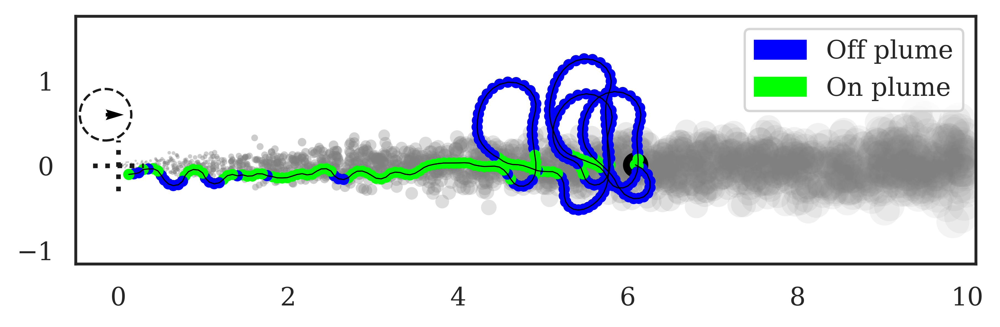

193 None 205 None


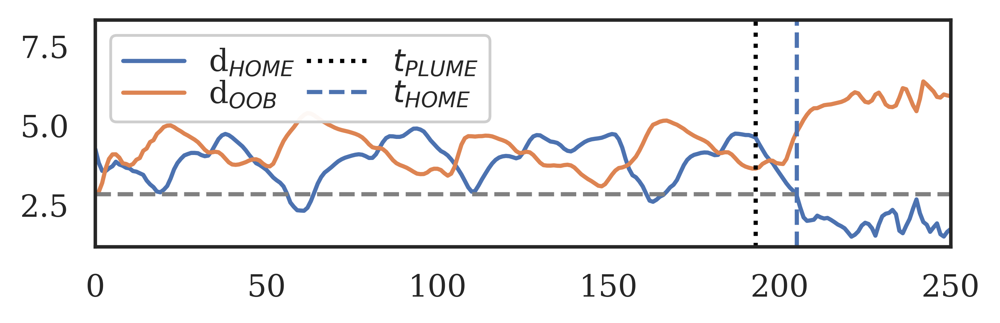

constantx5b5


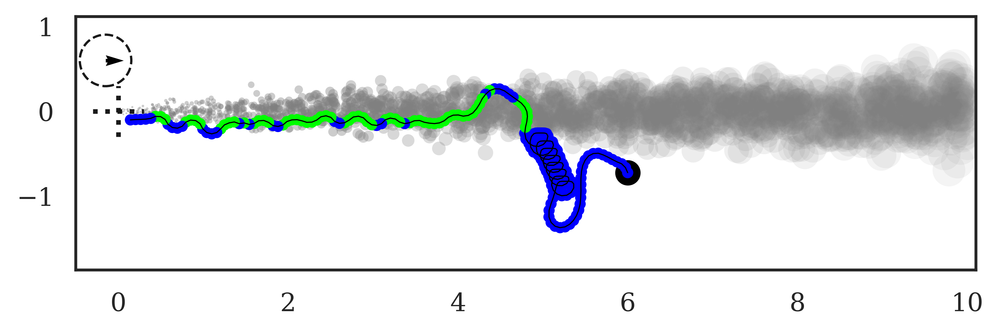

167 None 186 None


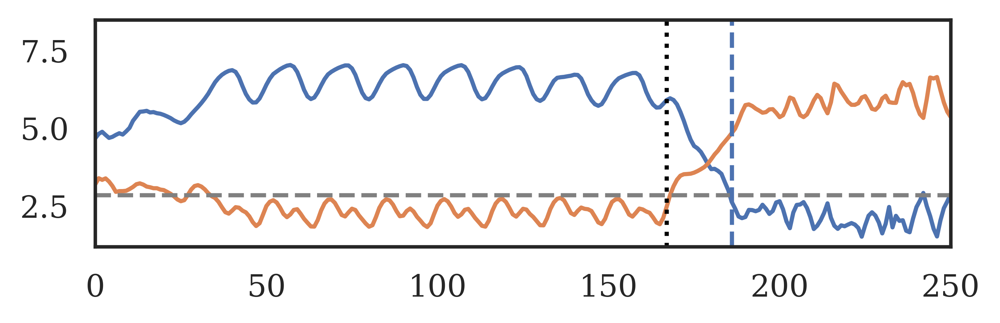

constantx5b5


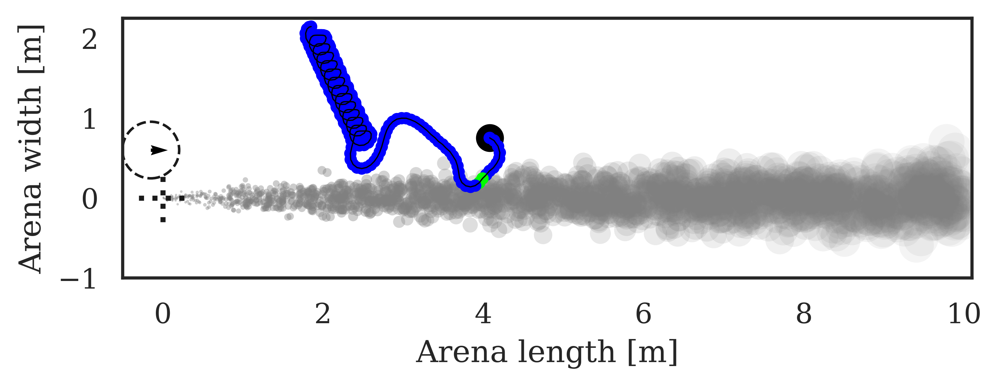

None 11 None 30


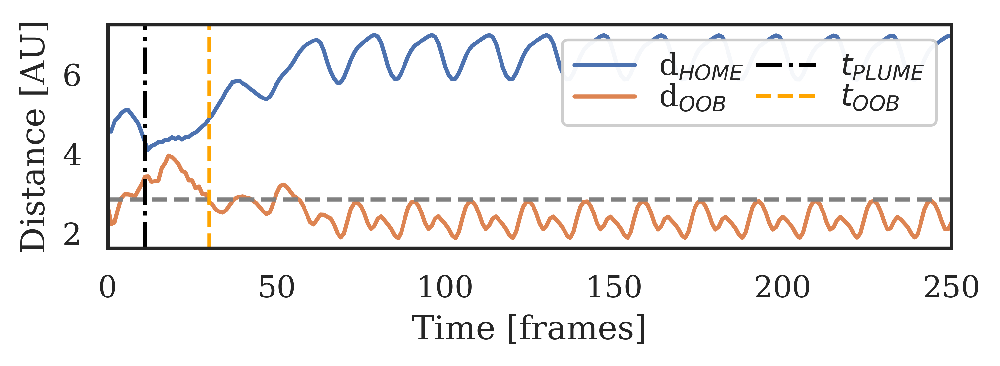

In [20]:
# Test
# %config InlineBackend.figure_format = 'png'
# mpl.rcParams['figure.dpi'] = 100

%config InlineBackend.figure_format = 'retina'
mpl.rcParams['figure.dpi'] = 300


importlib.reload(log_analysis)


ep_fig7 = [] # selected in above cell
# ep_fig7.append({'dataset':'constantx5b5', 'model_seed':'3307e9', 
#                     'idx':108, 'birthx':1.0, 'zoom':1, 'outcome': 'HOME'})
ep_fig7.append({'dataset':'constantx5b5', 'model_seed':'3307e9', 
                    'idx':82, 'birthx':1.0, 'zoom':1, 'outcome': 'HOME'})

ep_fig7.append({'dataset':'constantx5b5', 'model_seed':'3307e9', 
                    'idx':130, 'birthx':1.0, 'zoom':1, 'outcome': 'HOME'})
ep_fig7.append({'dataset':'constantx5b5', 'model_seed':'3307e9', 
                    'idx':44, 'birthx':1.0, 'zoom':1, 'outcome': 'OOB'})
ep_fig7 = pd.DataFrame(ep_fig7)

importlib.reload(agent_analysis)
import sim_analysis
importlib.reload(sim_analysis)
importlib.reload(config)
ttcs_colormap = config.ttcs_colormap


for i, row in ep_fig7.iterrows():
    model_seed = row['model_seed']
    dataset = row['dataset']
    birthx = row['birthx']
    idx = row['idx']
    outcome = row['outcome']
    task = dataset if birthx==1.0 else f"{dataset}_{birthx}"

    subset = selected_df_all.query("outcome == @outcome and dataset == @task and model_seed == @model_seed and idx == @idx")
#     print(subset)
    logs = subset['log'].to_list()
    zoom = row['zoom']
    zoom = -1

    # Load TTCS data
    subset_ttcs = ttcs_df.query("outcome == @outcome and dataset == @task and idx == @idx")
    home_distances = subset_ttcs['home_distances'].to_list()[0]
    oob_distances = subset_ttcs['oob_distances'].to_list()[0]
    entry_idx = subset_ttcs['entry_idx'].item()
    exit_idx = subset_ttcs['exit_idx'].item()
    home_idx = subset_ttcs['home_idx'].item()
    oob_idx = subset_ttcs['oob_idx'].item()
    range_oob = subset_ttcs['range_oob'].item()
    range_home = subset_ttcs['range_home'].item()


    # Plot traj
    closer_to_home = [ home_distances[i] < oob_distances[i] for i in range(len(oob_distances)) ] 
    colors = [ ttcs_colormap['HOME'] if x else ttcs_colormap['OOB'] for x in closer_to_home ]
    agent_analysis.visualize_episodes(logs, 
                                      zoom=zoom, 
                                      dataset=dataset,
                                      animate=False,
                                      plotsize=(7,7), 
                                      birthx=birthx,
#                                       colorby=colors,
                                     )
    if i == 0:
        handles, labels = plt.gca().get_legend_handles_labels()
        patch1 = mpatches.Patch(color=config.traj_colormap['off'], label='Off plume')   
        patch2 = mpatches.Patch(color=config.traj_colormap['on'], label='On plume')   
        # line = Line2D([0], [0], label = 'manual line',color='b')
        handles.extend([patch1, patch2])
        # handles.extend([patch,line])
        plt.legend(handles=handles)
        plt.xlabel('')
        plt.show()
    elif i == 1:
        plt.xlabel('')
        plt.show()
    elif i == 2:
        plt.ylabel("Arena width [m]")
        plt.xlabel("Arena length [m]")
        plt.ylim(-1,2.25)
#         plt.xlim(-0.5,9.5)
        fig = matplotlib.pyplot.gcf()
        fig.set_size_inches(6, 6)
        plt.show()
    else:
        plt.show()
    
    # Plot TTCS
    print(entry_idx, exit_idx, home_idx, oob_idx)    
    pd.Series(home_distances).plot(figsize=(5.5, 1.5), label=r'd$_{HOME}$') # Blue
    pd.Series(oob_distances).plot(label=r'd$_{OOB}$') # Orange

    if outcome == 'HOME':
        plt.axhline(y=range_home, c='grey', ls='--')
        plt.axvline(x=entry_idx, c='black', ls=':', label=r'$t_{PLUME}$')
        plt.axvline(x=home_idx, c='b', ls='--', label=r'$t_{HOME}$')
    if outcome == 'OOB':
        plt.axhline(y=range_oob, c='grey', ls='--')
        plt.axvline(x=exit_idx, c='black', ls='-.', label=r'$t_{PLUME}$')
        plt.axvline(x=oob_idx, c='orange', ls='--', label=r'$t_{OOB}$')

    if i == 0:
        plt.legend(loc='upper left', ncol=2, labelspacing=0.05, columnspacing=0.4, framealpha=0.95)
        plt.xlabel('')
    if i == 1:
        plt.xlabel('')
    if i == 2:
        plt.legend(loc='upper right', ncol=2, labelspacing=0.05, columnspacing=0.4, framealpha=0.95)
        plt.ylabel("Distance [AU]")
        plt.xlabel("Time [frames]")
    plt.xlim(0,250)
    plt.show()
    


## Figure for centerline tracking

In [21]:
# # # Find a few good examples
# importlib.reload(agent_analysis)
# import sim_analysis
# importlib.reload(sim_analysis)
# dataset = 'switch45x5b5'
# # dataset = 'noisy3x5b5'
# # dataset = 'constantx5b5'
# birthx = 1.0

# centerline_filename = f'{config.datadir}/centerline_data_{dataset}.pickle' 
# centerline_df = pd.read_pickle(centerline_filename)

# task = dataset if birthx==1.0 else f"{dataset}_{birthx}"
# subset =  selected_df_all.query("outcome == 'HOME' and dataset == @task and model_seed == @model_seed").tail(5)
# logs = subset['log'].to_list()
# idxs = subset['idx'].to_list()
# print(idxs)
# for log in logs:
#     traj_df = log_analysis.get_traj_df(log, 
#         extended_metadata=False, 
#         squash_action=True,
#         seed=model_seed)
#     regime_colorby = log_analysis.regime_to_colors( traj_df['regime'].to_list() )
    
#     agent_analysis.visualize_episodes([log], 
#                                       zoom=-1, 
#                                       dataset=dataset,
#                                       episode_idxs=idxs,
#                                       animate=False,
#                                       plotsize=(8,8), 
#                                       birthx=birthx,
#                                       colorby=regime_colorby,
#                                      )
    
#     tidx = (100*traj_df['t_val']).to_numpy(dtype=int)[-1]
#     print(tidx)
#     centerline_t = centerline_df[ centerline_df.tidx == tidx ]
#     plt.plot(centerline_t['x'], centerline_t['y'], lw=2, c='r')
#     plt.show()





# # ep_selected7 = [] # selected in above cell
# # ep_selected7.append({'dataset':'constantx5b5', 'model_seed':'3307e9', 
# #                     'idx':130, 'birthx':1.0, 'zoom':1, 'outcome': 'HOME'})
# # ep_selected7.append({'dataset':'constantx5b5', 'model_seed':'3307e9', 
# #                     'idx':189, 'birthx':1.0, 'zoom':1, 'outcome': 'OOB'})
# # ep_selected7 = pd.DataFrame(ep_selected7)


# # %config InlineBackend.figure_format = 'retina'
# # mpl.rcParams['figure.dpi'] = 300

# # importlib.reload(agent_analysis)
# # import sim_analysis
# # importlib.reload(sim_analysis)
# # importlib.reload(log_analysis)
# # importlib.reload(config)

# # for idx, row in ep_selected7.iterrows():
# #     model_seed = row['model_seed']
# #     dataset = row['dataset']
# #     birthx = row['birthx']
# #     idx = row['idx']
# #     outcome = row['outcome']
# #     task = dataset if birthx==1.0 else f"{dataset}_{birthx}"

# #     subset = selected_df_all.query("outcome == @outcome and dataset == @task and model_seed == @model_seed and idx == @idx")
# # #     print(subset)
# #     logs = subset['log'].to_list()
# #     zoom = row['zoom']
# #     zoom = -1
    
# #     viz_log = logs[0]
# #     traj_df = log_analysis.get_traj_df(viz_log, 
# #         extended_metadata=False, 
# #         squash_action=True,
# #         seed=model_seed)
# #     regime_colorby = log_analysis.regime_to_colors( traj_df['regime'].to_list() )


# #     agent_analysis.visualize_episodes(logs, 
# #                                       zoom=zoom, 
# #                                       dataset=dataset,
# #                                       animate=False,
# #                                       plotsize=(7,7), 
# #                                       birthx=birthx,
# #                                       colorby=regime_colorby,
# # #                                       colorby='regime',
# #                                      )
    
# #     if outcome == 'HOME':
# #         plt.ylabel("Arena width [m]")
# #         plt.xlabel("Arena length [m]")

# # # from matplotlib.lines import Line2D
# # handles, labels = plt.gca().get_legend_handles_labels()
# # patch1 = mpatches.Patch(color=regime_colormap['TRACK'], label='Track')   
# # patch2 = mpatches.Patch(color=regime_colormap['RECOVER'], label='Recover')   
# # patch3 = mpatches.Patch(color=regime_colormap['SEARCH'], label='Lost')   
# # # line = Line2D([0], [0], label = 'manual line',color='b')
# # # line = Line2D([0], [0], label = 'manual line',color='b')
# # handles.extend([patch1, patch2, patch3])
# # # handles.extend([patch,line])
# # plt.legend(handles=handles, loc='upper left')
# # plt.show()

# # ep_selected2

In [22]:
logs[0]['infos'][-1]

[{'t_val': 72.16,
  'tidx': 7216,
  'flipx': 1.0,
  'location': [1.8505750232778957, 2.143910506620683],
  'location_last': [1.8268087699479258, 2.138219532075537],
  'location_initial': array([4.        , 0.77587891]),
  'stray_distance': 2.0269627886116437,
  'wind_ground': [0.5, 0.0],
  'angle': [0.5518839428714928, 0.8339209276667752],
  'reward': -0.2990059391645803,
  'r_radial_step': -0.09900593916458034,
  'movex': 1.0,
  'done': 'OOB',
  'radiusx': 1.0,
  'episode': {'r': -69.60952447289401},
  'terminal_observation': array([ 1.6441358 , -1.3236687 , -0.26453975], dtype=float32)}]

In [23]:
traj_df.columns


Index(['loc_x', 'loc_y', 't_val', 'wind_theta_obs', 'wind_x_obs', 'wind_y_obs',
       'step', 'turn', 'odor_obs', 'stray_distance', 'odor_01', 'odor_clip',
       'odor_lastenc', 'regime', 'agent_angle_ground', 'wind_angle_ground',
       'wind_speed_ground', 't_val_norm', 'odor_enc_2', 'odor_enc_4',
       'odor_enc_6', 'odor_enc_8', 'odor_enc_10', 'odor_enc_12', 'odor_enc_14',
       'odor_enc_16', 'odor_enc_18', 'odor_ewm', 'odor_ewm_2', 'odor_ewm_4',
       'odor_ewm_6', 'odor_ewm_8', 'odor_ewm_10', 'odor_ewm_12', 'odor_ewm_14',
       'odor_ewm_16', 'odor_ewm_18', 'odor_ma', 'odor_ma_2', 'odor_ma_4',
       'odor_ma_6', 'odor_ma_8', 'odor_ma_10', 'odor_ma_12', 'odor_ma_14',
       'odor_ma_16', 'odor_ma_18', 'odor_lastenc_norm', 'radius', 'r_step',
       'loc_x_dt1', 'loc_y_dt1', 'wind_theta_obs_dt1', 'odor_obs_dt1',
       'odor_01_dt1', 'odor_clip_dt1', 'odor_lastenc_dt1', 'radius_dt1',
       'stray_distance_dt1', 'r_step_dt1', 'agent_angle_ground_dt1',
       'wind_angle_gro